In [1]:
import tensorflow as tf### models
import numpy as np### math computations
import matplotlib.pyplot as plt### plotting bar chart
import sklearn### machine learning library
import cv2## image processing
from sklearn.metrics import confusion_matrix, roc_curve### metrics
import seaborn as sns### visualizations
import datetime
import pathlib
import io
import os
import time
import random
from google.colab import files
from PIL import Image
import albumentations as A
import tensorflow_datasets as tfds
import tensorflow_probability as tfp
import matplotlib.cm as cm
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import (GlobalAveragePooling2D, Activation, MaxPooling2D, Add, Conv2D, MaxPool2D, Dense,
                                     Flatten, InputLayer, BatchNormalization, Input, Embedding, Permute,
                                     Dropout, RandomFlip, RandomRotation, LayerNormalization, MultiHeadAttention,
                                     RandomContrast, Rescaling, Resizing, Reshape)
from tensorflow.keras.losses import BinaryCrossentropy,CategoricalCrossentropy, SparseCategoricalCrossentropy
from tensorflow.keras.metrics import Accuracy,TopKCategoricalAccuracy, CategoricalAccuracy, SparseCategoricalAccuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (Callback, CSVLogger, EarlyStopping, LearningRateScheduler,
                                        ModelCheckpoint, ReduceLROnPlateau)
from tensorflow.keras.regularizers  import L2, L1
from tensorflow.train import BytesList, FloatList, Int64List
from tensorflow.train import Example, Features, Feature
from google.colab import drive

# Setup kaggle api and download the dataset

In [2]:
!pip install -q kaggle

In [3]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

In [4]:
!chmod 600 /root/.kaggle/kaggle.json

In [5]:
!kaggle datasets download -d muhammadhananasghar/human-emotions-datasethes

Dataset URL: https://www.kaggle.com/datasets/muhammadhananasghar/human-emotions-datasethes
License(s): unknown
 84% 260M/309M [00:00<00:00, 1.36GB/s]
100% 309M/309M [00:00<00:00, 1.36GB/s]


# Extract the dataset

In [6]:
!unzip "/content/human-emotions-datasethes.zip" -d "/content/dataset/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/EmotionsDataset/data/nothing/720.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/721.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/722.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/723.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/724.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/725.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/726.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/727.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/728.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/729.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/73.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/730.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/731.jpg  
  inflating: /content/dataset/EmotionsDataset/data/no

# Setup the path for data

In [7]:
train_directory = "/content/dataset/Emotions Dataset/Emotions Dataset/train"
val_directory = "/content/dataset/Emotions Dataset/Emotions Dataset/test"

In [8]:
CLASS_NAMES = ["angry", "happy", "sad"]

In [9]:
!pip install wandb

In [10]:
import wandb
from wandb.integration.keras import WandbCallback
print(wandb.__version__)

0.21.0


In [11]:
!wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: sandeeph-de96 (sandeeph-de96-sandeeph) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [12]:
wandb.init(project='Human-Emotion-Detection')

wandb: Currently logged in as: sandeeph-de96 (sandeeph-de96-sandeeph) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


# Hyperparameter Configuration

In [13]:
wandb.config = {
    "BATCH_SIZE": 32,
    "IM_SIZE": 256,
    "LEARNING_RATE": 1e-3,
    "N_EPOCHS": 20,
    "DROPOUT_RATE": 0.0,
    "REGULARIZATION_RATE": 0.0,
    "N_FILTERS": 6,
    "KERNEL_SIZE": 3,
    "N_STRIDES": 1,
    "POOL_SIZE": 2,
    "N_DENSE_1": 1024,
    "N_DENSE_2": 128,
    "NUM_CLASSES": 3,
    "PATCH_SIZE": 16,
    "PROJ_DIM": 768,
    "CLASS_NAMES": ["angry", "happy", "sad"],
}

CONFIGURATION = wandb.config

# TensorFlow dataset for train and val

In [14]:
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_directory,
    labels='inferred',
    label_mode='categorical',
    class_names=CONFIGURATION["CLASS_NAMES"],
    color_mode='rgb',
    batch_size=CONFIGURATION["BATCH_SIZE"],
    image_size=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]),
    shuffle=True,
    seed=99,
)



val_dataset = tf.keras.utils.image_dataset_from_directory(
    val_directory,
    labels='inferred',
    label_mode='categorical',
    class_names=CONFIGURATION["CLASS_NAMES"],
    color_mode='rgb',
    batch_size=CONFIGURATION["BATCH_SIZE"],
    image_size=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]),
    shuffle=True,
    seed=99,
)

Found 6799 files belonging to 3 classes.
Found 2278 files belonging to 3 classes.


In [15]:
for i in val_dataset.take(1):
  print(i)

(<tf.Tensor: shape=(32, 256, 256, 3), dtype=float32, numpy=
array([[[[ 20.        ,  20.        ,  20.        ],
         [ 19.1875    ,  19.1875    ,  19.1875    ],
         [ 19.        ,  19.        ,  19.        ],
         ...,
         [ 29.125     ,  29.125     ,  29.125     ],
         [ 25.        ,  25.        ,  25.        ],
         [ 25.        ,  25.        ,  25.        ]],

        [[ 20.        ,  20.        ,  20.        ],
         [ 19.847656  ,  19.847656  ,  19.847656  ],
         [ 19.8125    ,  19.8125    ,  19.8125    ],
         ...,
         [ 28.820312  ,  28.820312  ,  28.820312  ],
         [ 25.660156  ,  25.660156  ,  25.660156  ],
         [ 25.        ,  25.        ,  25.        ]],

        [[ 20.6875    ,  20.6875    ,  20.6875    ],
         [ 21.246094  ,  21.246094  ,  21.246094  ],
         [ 21.847656  ,  21.847656  ,  21.847656  ],
         ...,
         [ 25.3125    ,  25.3125    ,  25.3125    ],
         [ 22.375     ,  22.375     ,  22.375 

# Visualize the dataset

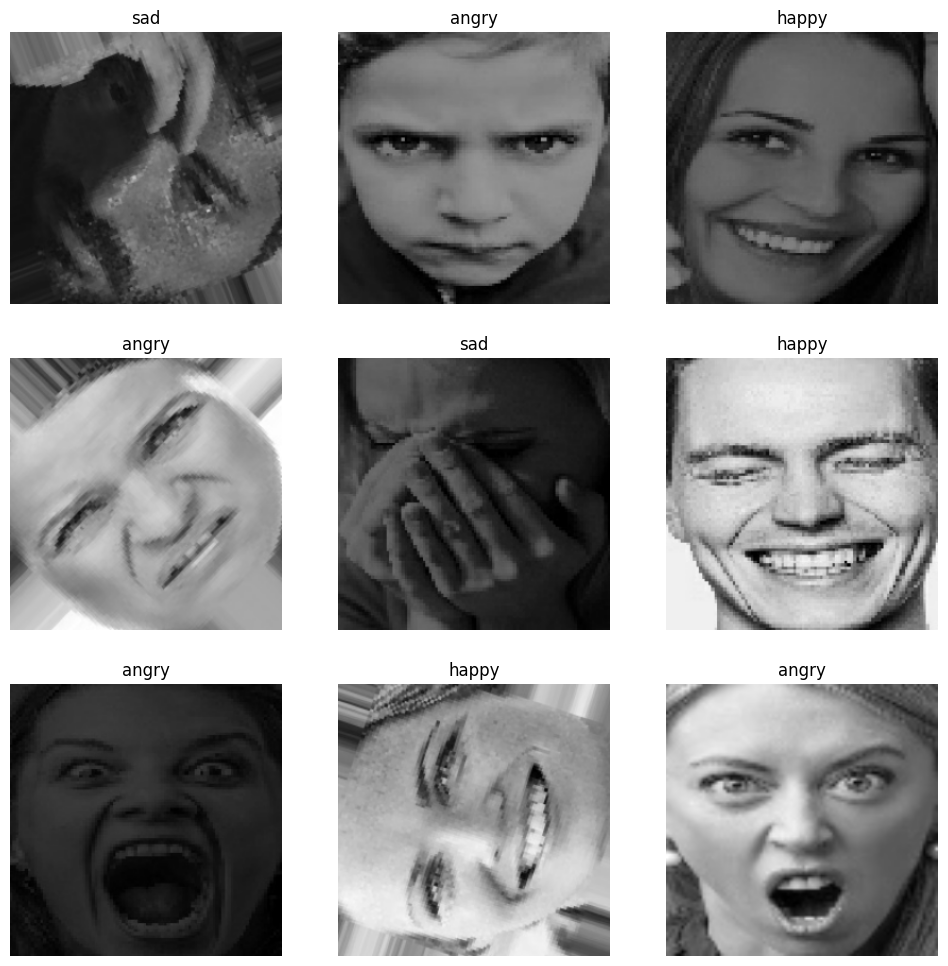

In [16]:
plt.figure(figsize = (12, 12))

for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(CONFIGURATION["CLASS_NAMES"][np.argmax(labels[i])])
    plt.axis("off")

# Data Augmentaion

In [17]:
### tf.keras.layer augment
augment_layers = tf.keras.Sequential([
  RandomRotation(factor = (-0.025, 0.025)),
  RandomFlip(mode='horizontal',),
  RandomContrast(factor=0.1),
])

In [18]:
def augment_layer(image, label):
  return augment_layers(image, training=True), label

#### Cut mix augmentaion

In [19]:
def box(lamda):

  r_x = tf.cast(tfp.distributions.Uniform(0, CONFIGURATION["IM_SIZE"]).sample(1)[0], dtype = tf.int32)
  r_y = tf.cast(tfp.distributions.Uniform(0, CONFIGURATION["IM_SIZE"]).sample(1)[0], dtype = tf.int32)

  r_w = tf.cast(CONFIGURATION["IM_SIZE"]*tf.math.sqrt(1-lamda), dtype = tf.int32)
  r_h = tf.cast(CONFIGURATION["IM_SIZE"]*tf.math.sqrt(1-lamda), dtype = tf.int32)

  r_x = tf.clip_by_value(r_x - r_w//2, 0, CONFIGURATION["IM_SIZE"])
  r_y = tf.clip_by_value(r_y - r_h//2, 0, CONFIGURATION["IM_SIZE"])

  x_b_r = tf.clip_by_value(r_x + r_w//2, 0, CONFIGURATION["IM_SIZE"])
  y_b_r = tf.clip_by_value(r_y + r_h//2, 0, CONFIGURATION["IM_SIZE"])

  r_w = x_b_r - r_x
  if(r_w == 0):
    r_w  = 1

  r_h = y_b_r - r_y
  if(r_h == 0):
    r_h = 1

  return r_y, r_x, r_h, r_w

In [20]:
def cutmix(train_dataset_1, train_dataset_2):
  (image_1,label_1), (image_2, label_2) = train_dataset_1, train_dataset_2

  lamda = tfp.distributions.Beta(2,2)
  lamda = lamda.sample(1)[0]

  r_y, r_x, r_h, r_w = box(lamda)
  crop_2 = tf.image.crop_to_bounding_box(image_2, r_y, r_x, r_h, r_w)
  pad_2 = tf.image.pad_to_bounding_box(crop_2, r_y, r_x, CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"])

  crop_1 = tf.image.crop_to_bounding_box(image_1, r_y, r_x, r_h, r_w)
  pad_1 = tf.image.pad_to_bounding_box(crop_1, r_y, r_x, CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"])

  image = image_1 - pad_1 + pad_2

  lamda = tf.cast(1- (r_w*r_h)/(CONFIGURATION["IM_SIZE"]*CONFIGURATION["IM_SIZE"]), dtype = tf.float32)
  label = lamda*tf.cast(label_1, dtype = tf.float32) + (1-lamda)*tf.cast(label_2, dtype = tf.float32)

  return image, label

In [21]:
train_dataset_1 = train_dataset.map(augment_layer, num_parallel_calls = tf.data.AUTOTUNE)
train_dataset_2 = train_dataset.map(augment_layer, num_parallel_calls = tf.data.AUTOTUNE)

mixed_dataset = tf.data.Dataset.zip((train_dataset_1, train_dataset_2))

In [22]:
training_dataset = (
    mixed_dataset
    .map(cutmix, num_parallel_calls = tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)

# Dataset Preparation

In [23]:
# training_dataset = (
#     train_dataset
#     .map(augment_layer, num_parallel_calls=tf.data.AUTOTUNE)
#     .prefetch(tf.data.AUTOTUNE)
# )



validation_dataset = (
    val_dataset.prefetch(tf.data.AUTOTUNE)
)

# Data Augmentaion

In [24]:
resize_rescale_layers = tf.keras.Sequential([
    Resizing(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]),
    Rescaling(1./255)
])

# Modeling

In [25]:
lenet_model = tf.keras.Sequential([

    # InputLayer(input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3)),
    InputLayer(input_shape=(None, None, 3)),
    resize_rescale_layers,

    Conv2D(filters=CONFIGURATION["N_FILTERS"], kernel_size=CONFIGURATION["KERNEL_SIZE"], strides=CONFIGURATION["N_STRIDES"], activation="relu", kernel_regularizer=L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    MaxPool2D(pool_size=CONFIGURATION["POOL_SIZE"], strides=CONFIGURATION["N_STRIDES"]*2),
    Dropout(CONFIGURATION["DROPOUT_RATE"]),

    Conv2D(filters=CONFIGURATION["N_FILTERS"]*2+4, kernel_size=CONFIGURATION["KERNEL_SIZE"], strides=CONFIGURATION["N_STRIDES"], activation="relu", kernel_regularizer=L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    MaxPool2D(pool_size=CONFIGURATION["POOL_SIZE"], strides=CONFIGURATION["N_STRIDES"]*2),

    Flatten(),

    Dense(CONFIGURATION["N_DENSE_1"], activation="relu", kernel_regularizer=L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    Dropout(CONFIGURATION["DROPOUT_RATE"]),

    Dense(CONFIGURATION["N_DENSE_2"], activation="relu", kernel_regularizer=L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),

    Dense(CONFIGURATION["NUM_CLASSES"], activation="softmax")

])

lenet_model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_1 (Sequential)       │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 6)    │           168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 254, 254, 6)    │            24 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 6)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 127, 127, 6)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 16)   │           880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 125, 125, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 61504)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │    62,981,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 63,118,451 (240.78 MB)

 Trainable params: 63,116,103 (240.77 MB)

 Non-trainable params: 2,348 (9.17 KB)

# Training

#### Setting up the loss funciton and metrics

In [26]:
loss_function = CategoricalCrossentropy()

In [27]:
metrics = [CategoricalAccuracy(name='accuracy'), TopKCategoricalAccuracy(k=3, name='top-3-accuracy')]

#### Compile the model

In [28]:
lenet_model.compile(
    optimizer = Adam(learning_rate=CONFIGURATION["LEARNING_RATE"]),
    loss = loss_function,
    metrics = metrics
)

#### Train the model

In [29]:
history = lenet_model.fit(
    training_dataset,
    validation_data = validation_dataset,
    epochs = CONFIGURATION["N_EPOCHS"],
    verbose = 1
)

Epoch 1/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 33s 106ms/step - accuracy: 0.4493 - loss: 1.2734 - top-3-accuracy: 1.0000 - val_accuracy: 0.4464 - val_loss: 1.0706 - val_top-3-accuracy: 1.0000
Epoch 2/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - accuracy: 0.5702 - loss: 0.9498 - top-3-accuracy: 1.0000 - val_accuracy: 0.5808 - val_loss: 0.9004 - val_top-3-accuracy: 1.0000
Epoch 3/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.6275 - loss: 0.8909 - top-3-accuracy: 1.0000 - val_accuracy: 0.6027 - val_loss: 0.8465 - val_top-3-accuracy: 1.0000
Epoch 4/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - accuracy: 0.6414 - loss: 0.8569 - top-3-accuracy: 1.0000 - val_accuracy: 0.6615 - val_loss: 0.7537 - val_top-3-accuracy: 1.0000
Epoch 5/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.6391 - loss: 0.8608 - top-3-accuracy: 1.0000 - val_accuracy: 0.6817 - val_loss: 0.7659 - val_top-3-accuracy: 1.0000
Epoch 6/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - accuracy: 0.6753 - loss

# Plot Loss-Accuracy Curves

In [30]:
def plot_training_curves(history, save_path=None, figsize=(14, 5), title_fontsize=16, label_fontsize=12):
    """
    Plots training and validation loss and accuracy side by side.

    Args:
        history (History): Keras history object returned by model.fit().
        save_path (str, optional): If provided, saves the plot to this path.
        figsize (tuple): Size of the plot.
        title_fontsize (int): Font size for titles.
        label_fontsize (int): Font size for labels and legends.
    """
    # Extract metrics
    acc = history.history.get('accuracy')
    val_acc = history.history.get('val_accuracy')
    loss = history.history.get('loss')
    val_loss = history.history.get('val_loss')

    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=figsize)

    # Accuracy subplot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, 'b-', label='Train Accuracy')
    plt.plot(epochs_range, val_acc, 'r--', label='Validation Accuracy')
    plt.title('Model Accuracy', fontsize=title_fontsize)
    plt.xlabel('Epoch', fontsize=label_fontsize)
    plt.ylabel('Accuracy', fontsize=label_fontsize)
    plt.legend(fontsize=label_fontsize)
    plt.grid(True)

    # Loss subplot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, 'b-', label='Train Loss')
    plt.plot(epochs_range, val_loss, 'r--', label='Validation Loss')
    plt.title('Model Loss', fontsize=title_fontsize)
    plt.xlabel('Epoch', fontsize=label_fontsize)
    plt.ylabel('Loss', fontsize=label_fontsize)
    plt.legend(fontsize=label_fontsize)
    plt.grid(True)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300)

    plt.show()


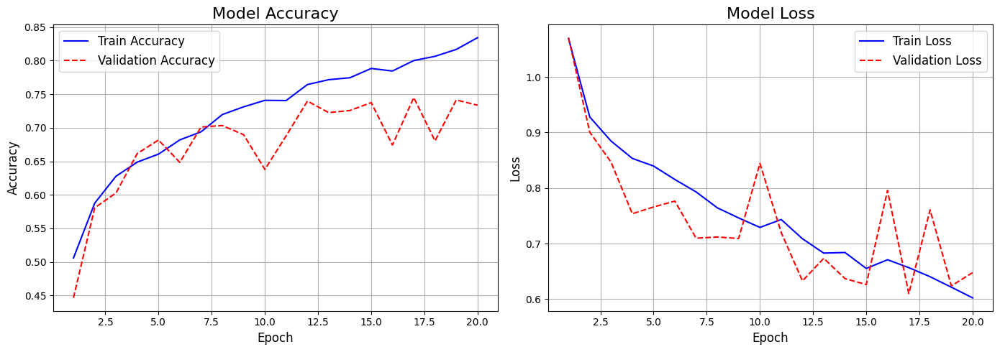

In [31]:
# Save the loss-acc curves
plot_training_curves(history, save_path="Model-1-loss-acc-curves.png")

# Evaluate the model

In [32]:
lenet_model.evaluate(validation_dataset)

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7352 - loss: 0.6497 - top-3-accuracy: 1.0000


[0.6476077437400818, 0.7335382103919983, 1.0]

# Testing

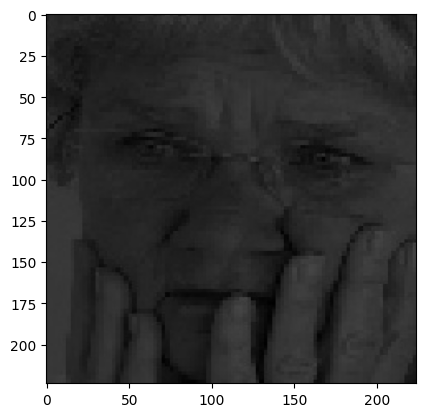

In [33]:
test_image = cv2.imread('/content/dataset/Emotions Dataset/Emotions Dataset/test/sad/113923.jpg_brightness_2.jpg')
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
plt.imshow(test_image)

In [34]:
im = tf.constant(test_image, dtype=tf.float32)
# im = tf.image.resize(im, (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]))  # Dont need this because our model have and inbuild resize rescale method
# im = im / 255.0
im = tf.expand_dims(im, axis=0)

In [35]:
CLASS_NAMES[(tf.argmax(lenet_model.predict(im), axis=-1).numpy()[0])]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step


'sad'

#### Plot the predictions

In [36]:
def plot_predictions_grid(model, dataset, class_names, num_images=16, normalize=True, figsize=(12, 12)):
    """
    Plots a grid of images with predicted and true labels.

    Args:
        model (tf.keras.Model): Trained model.
        dataset (tf.data.Dataset): Dataset to visualize (e.g., validation_dataset).
        class_names (list): List of class names.
        num_images (int): Number of images to display (must be square number).
        normalize (bool): Whether to divide pixel values by 255.
        figsize (tuple): Size of the full figure.
    """
    plt.figure(figsize=figsize)

    # Take one batch
    for images, labels in dataset.take(1):
        for i in range(num_images):
            ax = plt.subplot(int(np.sqrt(num_images)), int(np.sqrt(num_images)), i + 1)
            img = images[i].numpy()
            label = tf.argmax(labels[i], axis=-1).numpy()

            # Prediction
            prediction = model(tf.expand_dims(images[i], axis=0), training=False)
            pred_label = tf.argmax(prediction, axis=-1).numpy()[0]

            # Normalize if needed
            img_display = img / 255.0 if normalize else img

            # Show image
            plt.imshow(img_display)
            plt.axis('off')

            # Title formatting
            correct = (label == pred_label)
            color = 'green' if correct else 'red'
            title = f"True: {class_names[label]}\nPred: {class_names[pred_label]}"
            ax.set_title(title, color=color, fontsize=10, pad=4)

        plt.tight_layout()
        plt.show()
        break  # Only one batch


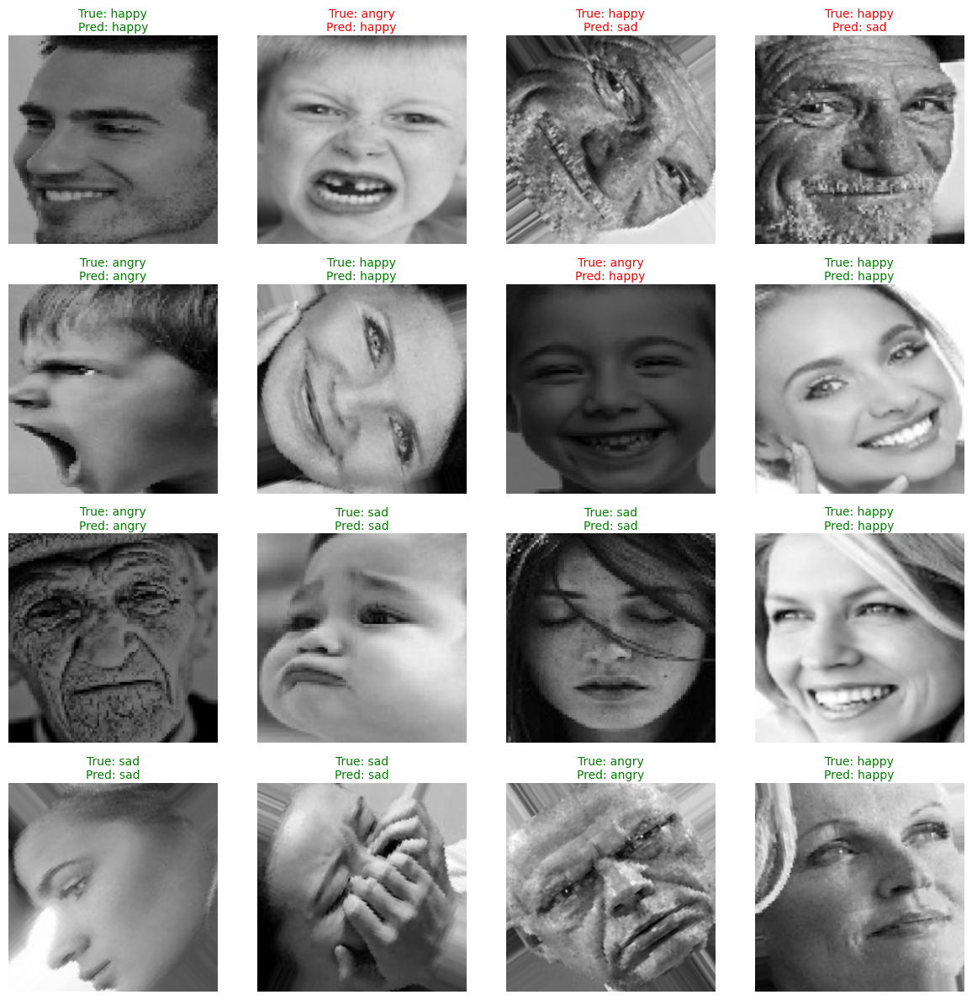

In [37]:
plot_predictions_grid(
    model=lenet_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    num_images=16,
    normalize=True
)

#### Confusion Matrix

In [38]:
def plot_confusion_matrix(model, dataset, class_names, normalize=False, figsize=(10, 8), cmap='Blues'):
    """
    Plots a beautiful confusion matrix using model predictions.

    Args:
        model: Trained Keras model.
        dataset: tf.data.Dataset (validation or test set).
        class_names: List of class names.
        normalize: If True, show percentages instead of raw counts.
        figsize: Size of the confusion matrix plot.
        cmap: Color map used for the heatmap.
    """
    true_labels = []
    pred_labels = []

    for images, labels in dataset:
        preds = model.predict(images, verbose=0)
        pred_indices = np.argmax(preds, axis=1)
        true_indices = np.argmax(labels.numpy(), axis=1)

        pred_labels.extend(pred_indices)
        true_labels.extend(true_indices)

    cm = confusion_matrix(true_labels, pred_labels)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        fmt = '.2f'
    else:
        fmt = 'd'

    plt.figure(figsize=figsize)
    sns.heatmap(cm, annot=True, fmt=fmt, cmap=cmap, xticklabels=class_names, yticklabels=class_names)
    plt.title("Confusion Matrix", fontsize=16)
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)
    plt.tight_layout()
    plt.show()


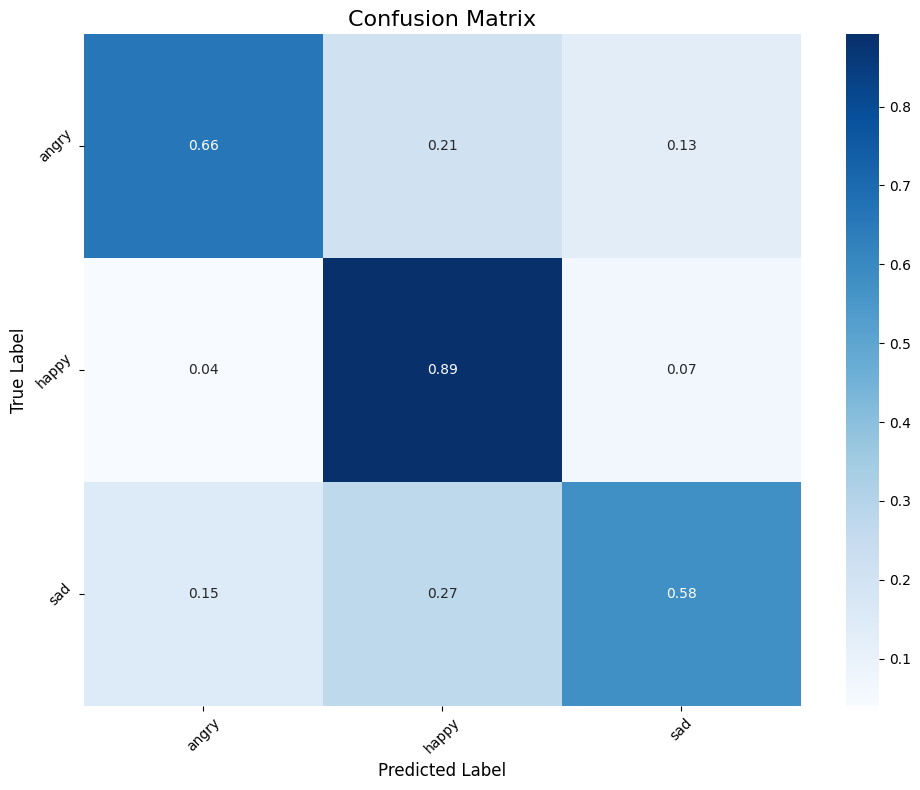

In [39]:
plot_confusion_matrix(
    model=lenet_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    normalize=True
)

In [40]:
from sklearn.metrics import classification_report
import pandas as pd

def classification_dashboard(model, dataset, class_names):
    """
    Prints classification report with precision, recall, F1-score.

    Args:
        model: Trained Keras model.
        dataset: tf.data.Dataset to evaluate.
        class_names: List of class names.
    """
    true_labels = []
    pred_labels = []

    for images, labels in dataset:
        preds = model.predict(images, verbose=0)
        pred_indices = np.argmax(preds, axis=1)
        true_indices = np.argmax(labels.numpy(), axis=1)

        pred_labels.extend(pred_indices)
        true_labels.extend(true_indices)

    # Generate and print classification report
    report = classification_report(true_labels, pred_labels, target_names=class_names, output_dict=True)
    report_df = pd.DataFrame(report).transpose()

    print("\nClassification Report:")
    display(report_df.round(2))


In [41]:
classification_dashboard(
    model=lenet_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"]
)



Classification Report:


,precision,recall,f1-score,support
angry,0.69,0.66,0.67,515.00
happy,0.74,0.89,0.81,1006.00
sad,0.76,0.58,0.66,757.00
accuracy,0.73,0.73,0.73,0.73
macro avg,0.73,0.71,0.71,2278.00
weighted avg,0.73,0.73,0.73,2278.00


# Resnet model

In [42]:
class CustomConv2D(Layer):
  def __init__(self, n_filters, kernel_size, n_strides, padding='valid'):
    super(CustomConv2D, self).__init__(name='custom_conv2d')

    self.conv = Conv2D(
        filters=n_filters,
        kernel_size=kernel_size,
        activation='relu',
        strides=n_strides,
        padding=padding
    )
    self.batch_norm = BatchNormalization()

  def call(self, x, training=True):
    x = self.conv(x)
    x = self.batch_norm(x, training=training)
    return x

In [43]:
class ResidualBlock(Layer):
  def __init__(self, n_channels, n_strides=1):
    super(ResidualBlock, self).__init__(name='res_block')

    self.downsample = (n_strides != 1)

    self.custom_conv_1 = CustomConv2D(n_channels, 3, n_strides, padding="same")
    self.custom_conv_2 = CustomConv2D(n_channels, 3, 1, padding="same")

    self.activation = Activation('relu')

    if self.downsample:
      self.custom_conv_3 = CustomConv2D(n_channels, 1, n_strides)

  def call(self, input_tensor, training=True):
    x = self.custom_conv_1(input_tensor, training=training)
    x = self.custom_conv_2(x, training=training)

    if self.downsample:
      shortcut = self.custom_conv_3(input_tensor, training=training)
    else:
      shortcut = input_tensor

    x = Add()([x, shortcut])
    return self.activation(x)


In [44]:
class ResNet34(Model):
  def __init__(self,):
    super(ResNet34, self).__init__(name = 'resnet_34')

    self.conv_1 = CustomConv2D(64, 7, 2, padding = 'same')
    self.max_pool = MaxPooling2D(3,2)

    self.conv_2_1 = ResidualBlock(64)
    self.conv_2_2 = ResidualBlock(64)
    self.conv_2_3 = ResidualBlock(64)

    self.conv_3_1 = ResidualBlock(128, 2)
    self.conv_3_2 = ResidualBlock(128)
    self.conv_3_3 = ResidualBlock(128)
    self.conv_3_4 = ResidualBlock(128)

    self.conv_4_1 = ResidualBlock(256, 2)
    self.conv_4_2 = ResidualBlock(256)
    self.conv_4_3 = ResidualBlock(256)
    self.conv_4_4 = ResidualBlock(256)
    self.conv_4_5 = ResidualBlock(256)
    self.conv_4_6 = ResidualBlock(256)

    self.conv_5_1 = ResidualBlock(512, 2)
    self.conv_5_2 = ResidualBlock(512)
    self.conv_5_3 = ResidualBlock(512)

    self.global_pool = GlobalAveragePooling2D()

    self.fc_3 = Dense(CONFIGURATION["NUM_CLASSES"], activation = 'softmax')

  def call(self, x, training=True):
      x = self.conv_1(x, training=training)
      x = self.max_pool(x)

      x = self.conv_2_1(x, training=training)
      x = self.conv_2_2(x, training=training)
      x = self.conv_2_3(x, training=training)

      x = self.conv_3_1(x, training=training)
      x = self.conv_3_2(x, training=training)
      x = self.conv_3_3(x, training=training)
      x = self.conv_3_4(x, training=training)

      x = self.conv_4_1(x, training=training)
      x = self.conv_4_2(x, training=training)
      x = self.conv_4_3(x, training=training)
      x = self.conv_4_4(x, training=training)
      x = self.conv_4_5(x, training=training)
      x = self.conv_4_6(x, training=training)

      x = self.conv_5_1(x, training=training)
      x = self.conv_5_2(x, training=training)
      x = self.conv_5_3(x, training=training)

      x = self.global_pool(x)
      return self.fc_3(x)


In [45]:
resnet_34 = ResNet34()
resnet_34(tf.zeros([1,256,256,3]), training = False)
resnet_34.summary()

Model: "resnet_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ custom_conv2d (CustomConv2D)    │ ?                      │         9,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │        74,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │        74,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │        74,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │       231,296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │       296,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │       296,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │       296,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │       921,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │     1,182,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │     1,182,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │     1,182,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │     1,182,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │     1,182,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │     3,677,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │     4,723,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ res_block (ResidualBlock)       │ ?                      │     4,723,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (1, 3)                 │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,311,747 (81.30 MB)

 Trainable params: 21,294,723 (81.23 MB)

 Non-trainable params: 17,024 (66.50 KB)

In [46]:
checkpoint_callback = ModelCheckpoint(
    'best_weights.keras',
    monitor='val_accuracy',
    mode = 'max',
    save_best_only=True,
    verbose=1
)

In [47]:
resnet_34.compile(
    optimizer = Adam(learning_rate=CONFIGURATION["LEARNING_RATE"]*10),
    loss = loss_function,
    metrics = metrics
)

In [48]:
history = resnet_34.fit(
    training_dataset,
    validation_data = validation_dataset,
    epochs = CONFIGURATION["N_EPOCHS"],
    verbose = 1,
    callbacks = [checkpoint_callback]
)

Epoch 1/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.5526 - loss: 2.3112 - top-3-accuracy: 1.0000
Epoch 1: val_accuracy improved from -inf to 0.37972, saving model to best_weights.keras
213/213 ━━━━━━━━━━━━━━━━━━━━ 83s 210ms/step - accuracy: 0.5523 - loss: 2.3074 - top-3-accuracy: 1.0000 - val_accuracy: 0.3797 - val_loss: 1.1352 - val_top-3-accuracy: 1.0000
Epoch 2/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - accuracy: 0.4319 - loss: 1.1699 - top-3-accuracy: 1.0000
Epoch 2: val_accuracy improved from 0.37972 to 0.45171, saving model to best_weights.keras
213/213 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - accuracy: 0.4320 - loss: 1.1697 - top-3-accuracy: 1.0000 - val_accuracy: 0.4517 - val_loss: 1.2355 - val_top-3-accuracy: 1.0000
Epoch 3/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - accuracy: 0.4751 - loss: 1.0868 - top-3-accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.45171 to 0.49166, saving model to best_weights.keras
213/213 ━━━━━━━━━━━━━━━━━━━━ 27s 120ms/step

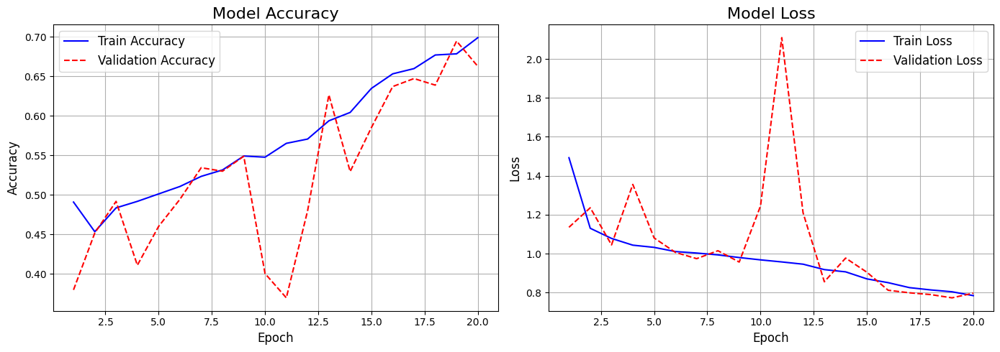

In [49]:
plot_training_curves(history)

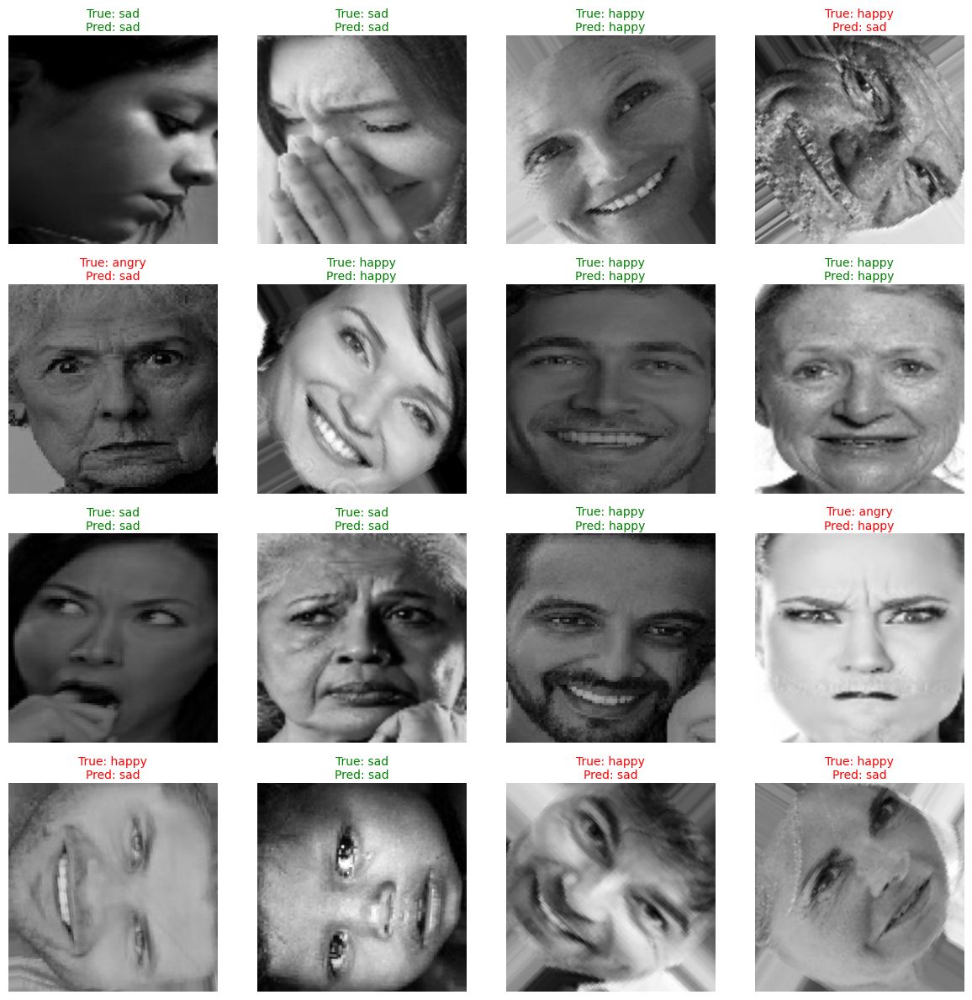

In [50]:
plot_predictions_grid(
    model=resnet_34,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    num_images=16,
    normalize=True
)

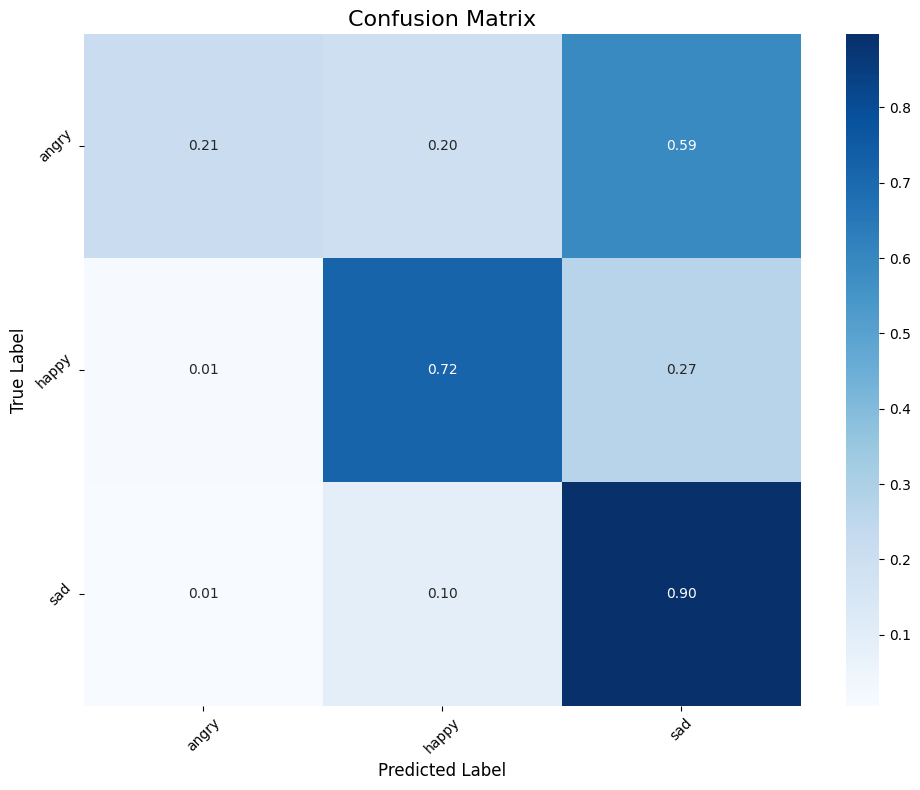

In [51]:
plot_confusion_matrix(
    model=resnet_34,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    normalize=True
)

In [52]:
classification_dashboard(
    model=resnet_34,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"]
)



Classification Report:


,precision,recall,f1-score,support
angry,0.88,0.21,0.34,515.00
happy,0.80,0.72,0.76,1006.00
sad,0.54,0.90,0.67,757.00
accuracy,0.66,0.66,0.66,0.66
macro avg,0.74,0.61,0.59,2278.00
weighted avg,0.73,0.66,0.64,2278.00


# Transfer Learning

In [53]:
backborn = tf.keras.applications.efficientnet.EfficientNetB4(
    include_top=False,
    weights='imagenet',
    input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3),
)

71686520/71686520 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [54]:
backborn.summary()

Model: "efficientnetb4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 256, 256,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 256, 256,  │          7 │ rescaling_1[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 256, 256,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 257, 257,  │          0 │ rescaling_2[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 128, 128,  │      1,296 │ stem_conv_pad[0]… │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 128, 128,  │        192 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 128, 128,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 128, 128,  │        432 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 128, 128,  │        192 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 128, 128,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 48)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 48)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 12)  │        588 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 48)  │        624 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 128, 128,  │          0 │ block1a_activati… │
│ (Multiply)          │ 48)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 128, 128,  │      1,152 │ block1a_se_excit

 Total params: 17,673,823 (67.42 MB)

 Trainable params: 17,548,616 (66.94 MB)

 Non-trainable params: 125,207 (489.09 KB)

In [55]:
backborn.trainable = False

In [56]:
pretrained_model = tf.keras.Sequential([
    Input(shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3)),
    backborn,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(CONFIGURATION["N_DENSE_1"], activation='relu'),
    BatchNormalization(),
    tf.keras.layers.Dense(CONFIGURATION["N_DENSE_2"], activation='relu'),
    tf.keras.layers.Dense(CONFIGURATION["NUM_CLASSES"], activation='softmax')
])

pretrained_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb4 (Functional)     │ (None, 8, 8, 1792)     │    17,673,823 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1792)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1024)           │     1,836,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_40          │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,645,538 (74.94 MB)

 Trainable params: 1,969,667 (7.51 MB)

 Non-trainable params: 17,675,871 (67.43 MB)

In [57]:
pretrained_model.compile(
    optimizer = Adam(learning_rate=CONFIGURATION["LEARNING_RATE"]),
    loss = loss_function,
    metrics = metrics
)

In [58]:
history = pretrained_model.fit(
    training_dataset,
    validation_data = validation_dataset,
    epochs = CONFIGURATION["N_EPOCHS"],
    verbose = 1,
    callbacks = [checkpoint_callback]
)

Epoch 1/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.6225 - loss: 1.1998 - top-3-accuracy: 1.0000
Epoch 1: val_accuracy did not improve from 0.69447
213/213 ━━━━━━━━━━━━━━━━━━━━ 109s 292ms/step - accuracy: 0.6224 - loss: 1.1992 - top-3-accuracy: 1.0000 - val_accuracy: 0.6361 - val_loss: 0.9066 - val_top-3-accuracy: 1.0000
Epoch 2/20
212/213 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.6697 - loss: 0.8656 - top-3-accuracy: 1.0000
Epoch 2: val_accuracy did not improve from 0.69447
213/213 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - accuracy: 0.6697 - loss: 0.8656 - top-3-accuracy: 1.0000 - val_accuracy: 0.6914 - val_loss: 0.7160 - val_top-3-accuracy: 1.0000
Epoch 3/20
212/213 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.6785 - loss: 0.8245 - top-3-accuracy: 1.0000
Epoch 3: val_accuracy improved from 0.69447 to 0.74759, saving model to best_weights.keras
213/213 ━━━━━━━━━━━━━━━━━━━━ 27s 119ms/step - accuracy: 0.6786 - loss: 0.8243 - top-3-accuracy: 1.0000 - val_accuracy: 0.

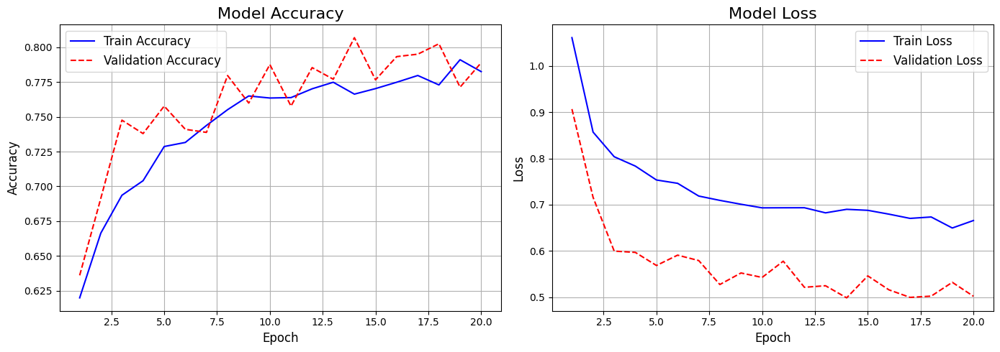

In [59]:
plot_training_curves(history)

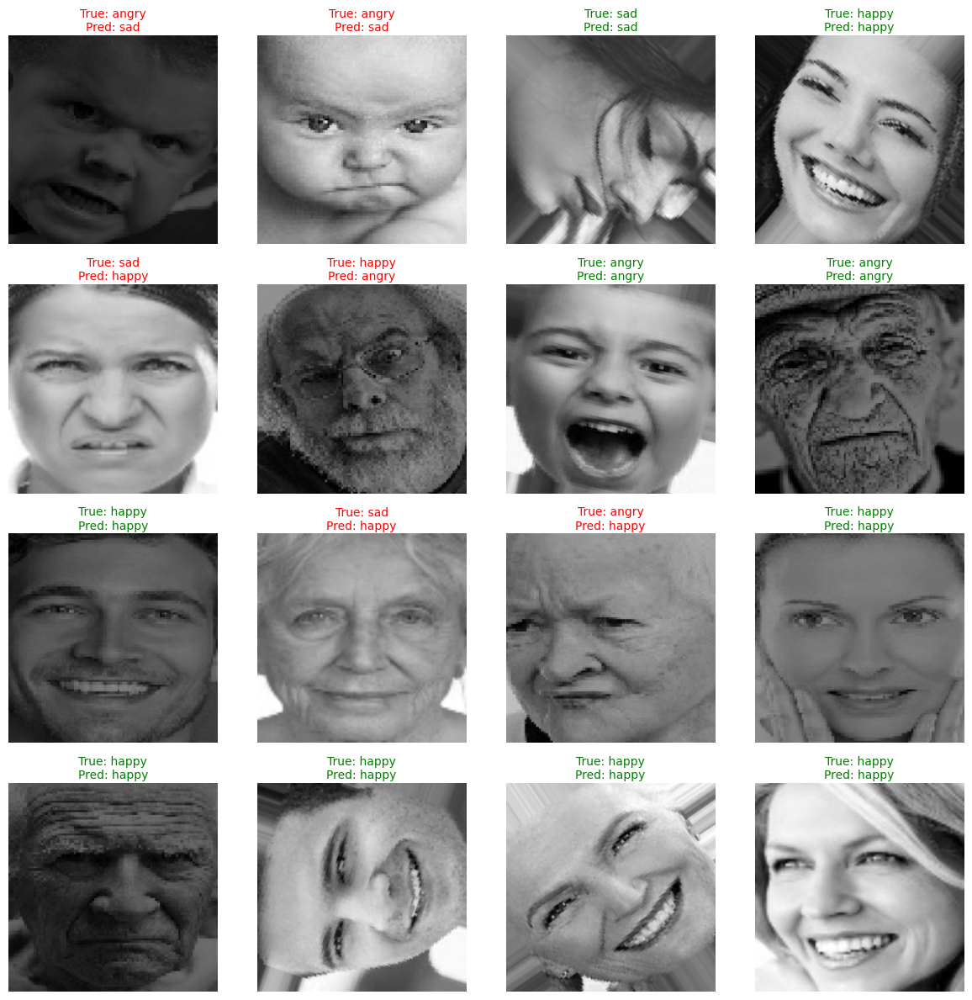

In [60]:
plot_predictions_grid(
    model=pretrained_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    num_images=16,
    normalize=True
)

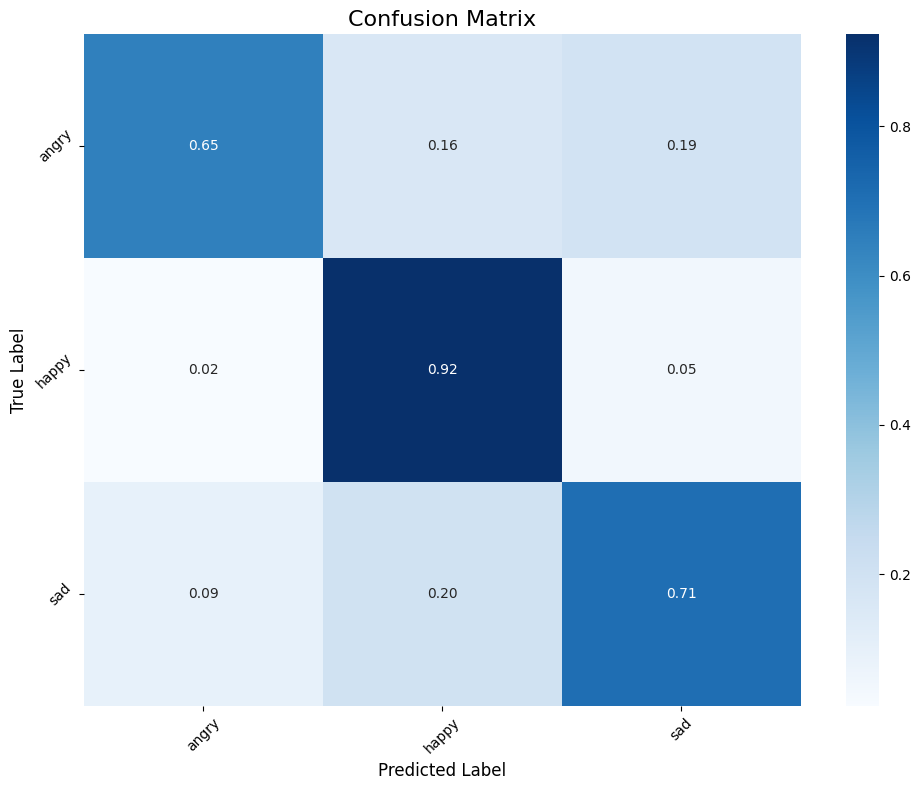

In [61]:
plot_confusion_matrix(
    model=pretrained_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    normalize=True
)

In [62]:
classification_dashboard(
    model=pretrained_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"]
)



Classification Report:


,precision,recall,f1-score,support
angry,0.78,0.65,0.71,515.00
happy,0.80,0.92,0.86,1006.00
sad,0.78,0.71,0.74,757.00
accuracy,0.79,0.79,0.79,0.79
macro avg,0.79,0.76,0.77,2278.00
weighted avg,0.79,0.79,0.78,2278.00


# Evaluate the model

In [63]:
pretrained_model.evaluate(validation_dataset)

72/72 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7774 - loss: 0.5203 - top-3-accuracy: 1.0000


[0.5021998882293701, 0.7888498902320862, 1.0]

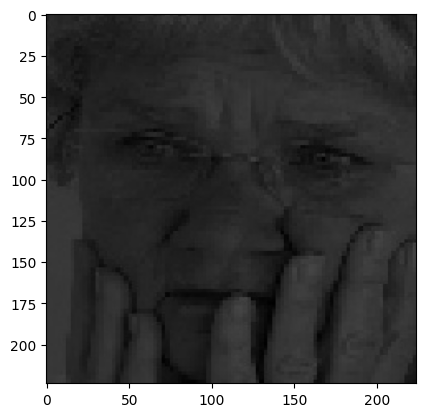

In [64]:
test_image = cv2.imread('/content/dataset/Emotions Dataset/Emotions Dataset/test/sad/113923.jpg_brightness_2.jpg')
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
plt.imshow(test_image)

im = tf.constant(test_image, dtype=tf.float32)
# im = tf.image.resize(im, (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]))  # Dont need this because our model have and inbuild resize rescale method
# im = im / 255.0
im = tf.expand_dims(im, axis=0)

In [65]:
CLASS_NAMES[(tf.argmax(pretrained_model.predict(im), axis=-1).numpy()[0])]

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


'sad'

# Fine Tuning

In [66]:
backborn.trainable = True

In [67]:
input = Input(shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3))

x = backborn(input, training = False)

x = GlobalAveragePooling2D()(x)
x = Dense(CONFIGURATION["N_DENSE_1"], activation='relu')(x)
x = BatchNormalization()(x)
x = Dense(CONFIGURATION["N_DENSE_2"], activation='relu')(x)

output = Dense(CONFIGURATION["NUM_CLASSES"], activation='softmax')(x)

fine_tuned_model = Model(input, output)

In [68]:
fine_tuned_model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb4 (Functional)     │ (None, 8, 8, 1792)     │    17,673,823 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1792)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1024)           │     1,836,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_41          │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,645,538 (74.94 MB)

 Trainable params: 19,518,283 (74.46 MB)

 Non-trainable params: 127,255 (497.09 KB)

In [69]:
fine_tuned_model.compile(
    optimizer = Adam(learning_rate=CONFIGURATION["LEARNING_RATE"]),
    loss = loss_function,
    metrics = metrics
)

In [70]:
history = fine_tuned_model.fit(
    training_dataset,
    validation_data = validation_dataset,
    epochs = CONFIGURATION["N_EPOCHS"],
    verbose = 1,
    # callbacks = [checkpoint_callback]
)

Epoch 1/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 273s 618ms/step - accuracy: 0.6993 - loss: 1.1533 - top-3-accuracy: 1.0000 - val_accuracy: 0.7305 - val_loss: 1.6435 - val_top-3-accuracy: 1.0000
Epoch 2/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 57s 263ms/step - accuracy: 0.6820 - loss: 0.9634 - top-3-accuracy: 1.0000 - val_accuracy: 0.6602 - val_loss: 0.8646 - val_top-3-accuracy: 1.0000
Epoch 3/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 57s 262ms/step - accuracy: 0.7231 - loss: 0.7621 - top-3-accuracy: 1.0000 - val_accuracy: 0.8143 - val_loss: 0.4700 - val_top-3-accuracy: 1.0000
Epoch 4/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 57s 262ms/step - accuracy: 0.7835 - loss: 0.6745 - top-3-accuracy: 1.0000 - val_accuracy: 0.8051 - val_loss: 0.5727 - val_top-3-accuracy: 1.0000
Epoch 5/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 57s 262ms/step - accuracy: 0.7889 - loss: 0.6688 - top-3-accuracy: 1.0000 - val_accuracy: 0.7243 - val_loss: 6.5131 - val_top-3-accuracy: 1.0000
Epoch 6/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 57s 263ms/step - accuracy: 0.7839 

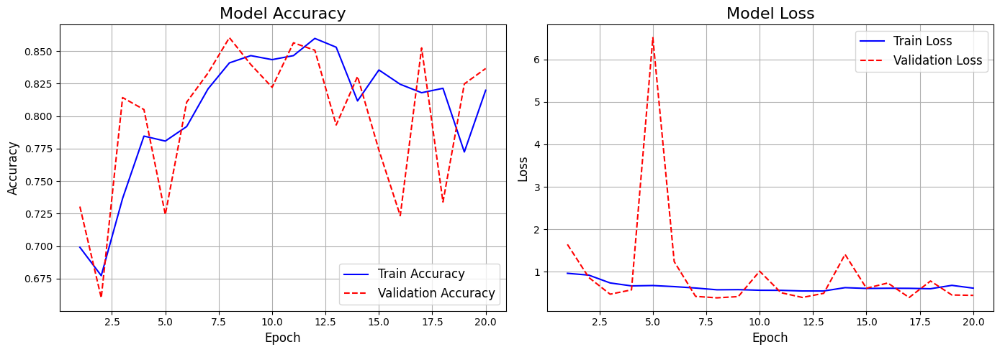

In [71]:
plot_training_curves(history)

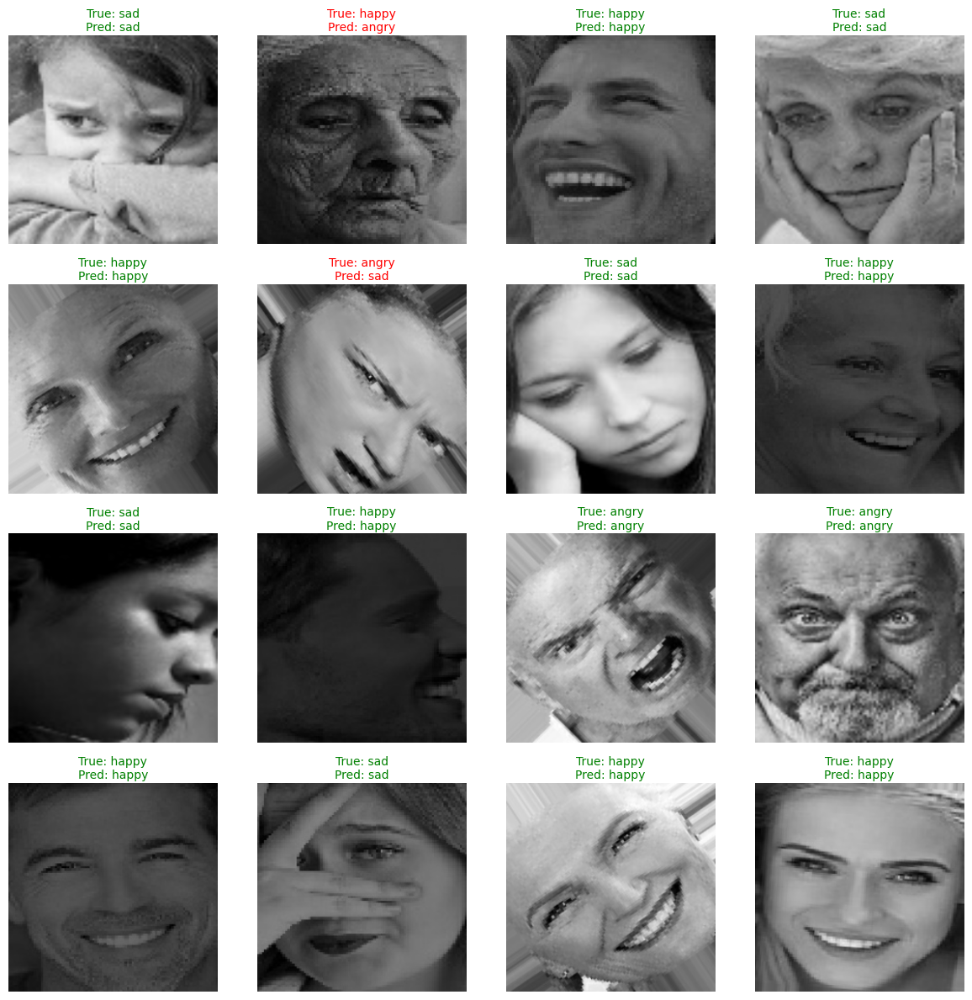

In [72]:
plot_predictions_grid(
    model=fine_tuned_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    num_images=16,
    normalize=True
)

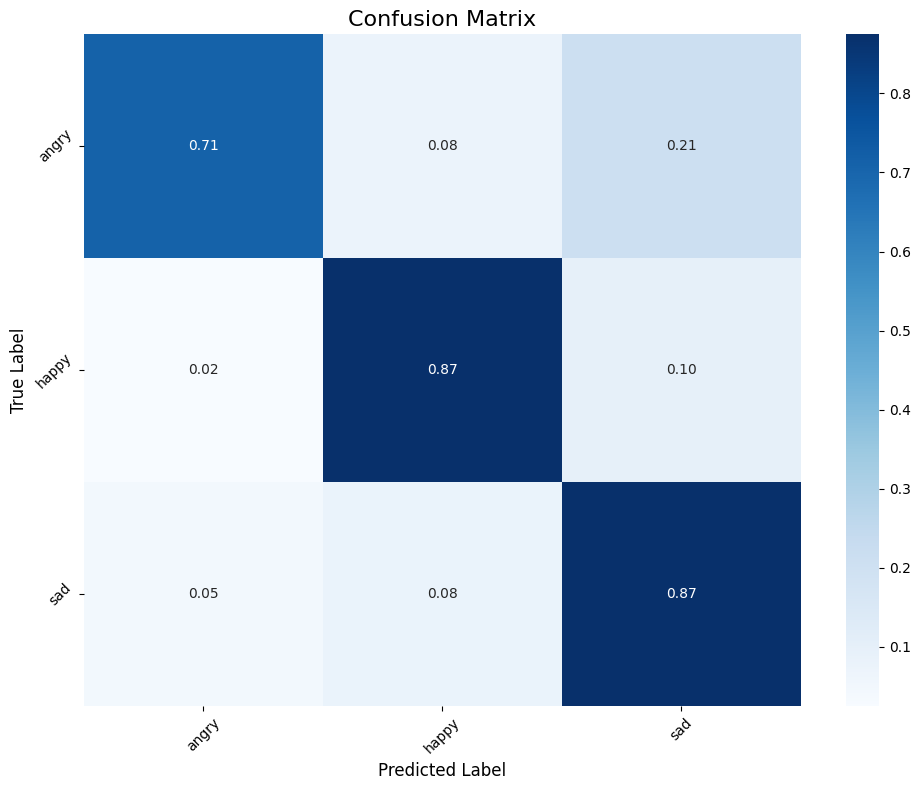

In [73]:
plot_confusion_matrix(
    model=fine_tuned_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    normalize=True
)

In [74]:
classification_dashboard(
    model=fine_tuned_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"]
)



Classification Report:


,precision,recall,f1-score,support
angry,0.86,0.71,0.78,515.00
happy,0.90,0.87,0.89,1006.00
sad,0.76,0.87,0.81,757.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.84,0.82,0.82,2278.00
weighted avg,0.84,0.84,0.84,2278.00


# Feature Map Visualization

In [75]:
vgg_backbone = tf.keras.applications.vgg16.VGG16(
    include_top=False,
    weights= None,
    input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3),

)

In [76]:
vgg_backbone.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [77]:
def is_conv(layer_name):
  if 'conv' in layer_name:
    return True
  else:
    return False

In [78]:
feature_maps = [layer.output for layer in vgg_backbone.layers[1:] if is_conv(layer.name)]
feature_map_model = Model(
    inputs = vgg_backbone.input,
    outputs = feature_maps
)

feature_map_model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [79]:
test_image = cv2.imread("/content/dataset/Emotions Dataset/Emotions Dataset/test/happy/111073.jpg")
test_image = cv2.resize(test_image, (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]))

im = tf.constant(test_image, dtype = tf.float32)
im = tf.expand_dims(im, axis = 0)

f_maps = feature_map_model.predict(im)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [80]:
print(len(f_maps))

13


In [81]:
for i in range(len(f_maps)):
  print(f_maps[i].shape)

(1, 256, 256, 64)
(1, 256, 256, 64)
(1, 128, 128, 128)
(1, 128, 128, 128)
(1, 64, 64, 256)
(1, 64, 64, 256)
(1, 64, 64, 256)
(1, 32, 32, 512)
(1, 32, 32, 512)
(1, 32, 32, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)


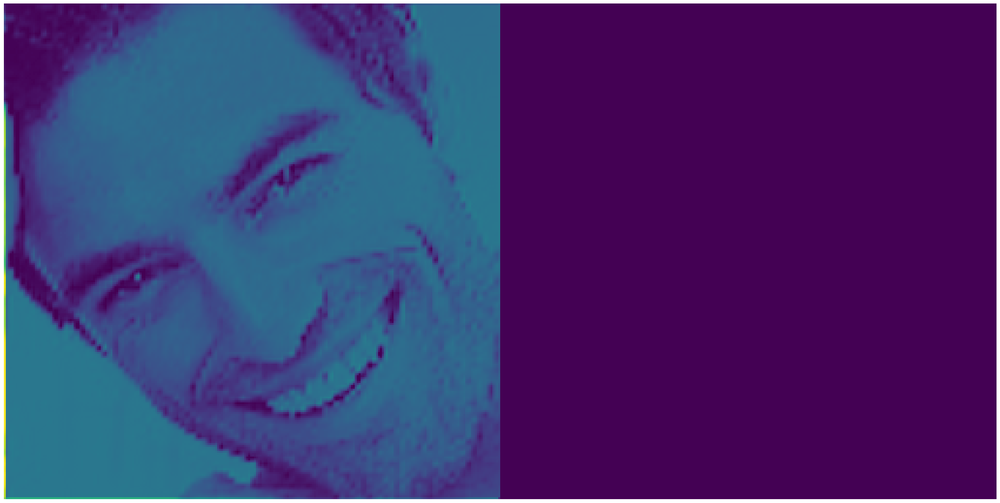

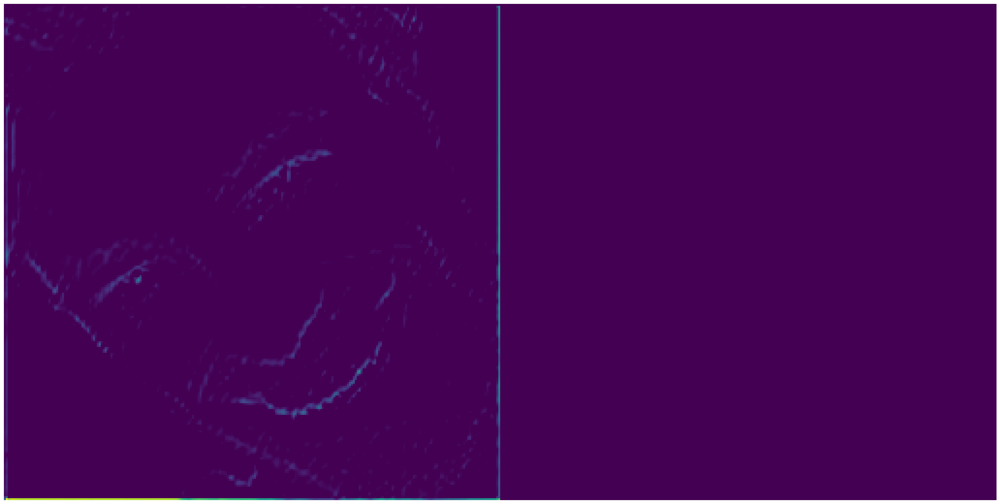

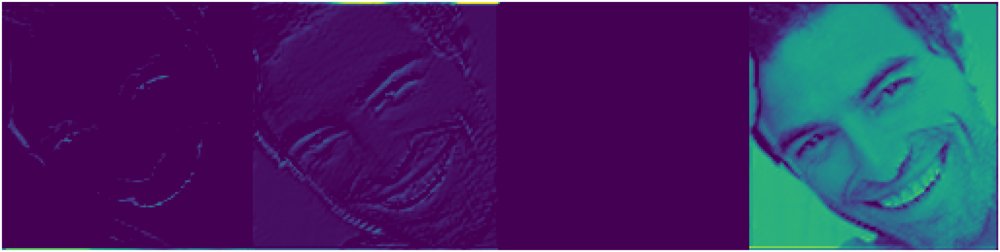

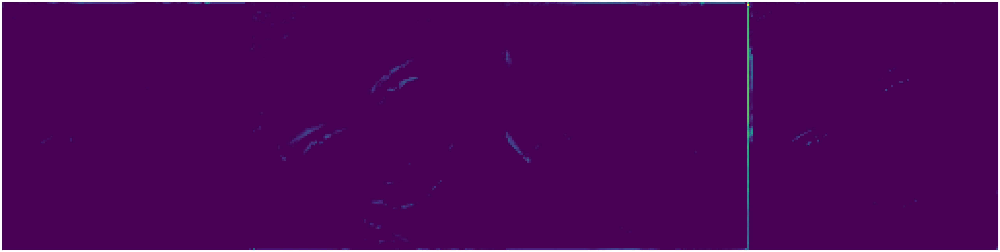

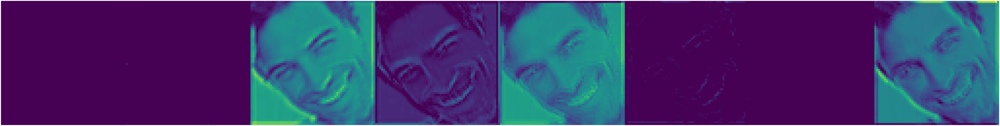

...

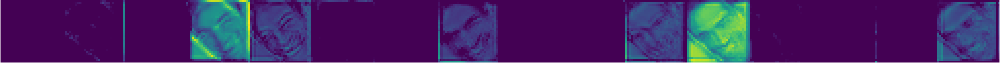

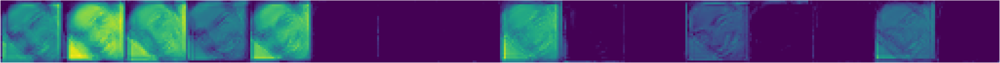

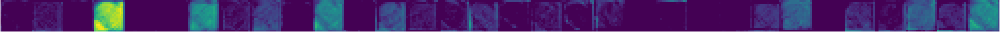

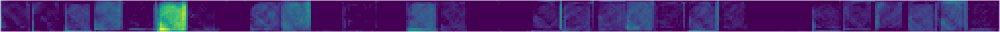

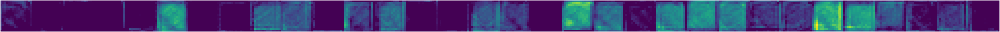

In [82]:
for i in range(len(f_maps)):
  plt.figure(figsize = (256,256))
  f_size = f_maps[i].shape[1]
  n_channels = f_maps[i].shape[3]
  joint_maps = np.ones((f_size, f_size*n_channels ))

  axs = plt.subplot(len(f_maps), 1, i+1)

  for j in range(n_channels):
    joint_maps[:, f_size*j:f_size*(j+1)] = f_maps[i][..., j]

  plt.imshow(joint_maps[:,0:512])
  plt.axis("off")


# Ensembling

In [83]:
inputs = Input(shape = (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3))

y_1 = resnet_34(inputs)
y_2 = pretrained_model(inputs)

output = 0.5*y_1 + 0.5*y_1

ensemble_model = Model(inputs = inputs, outputs = output)

In [84]:
ensemble_model.compile(
    optimizer = Adam(learning_rate=CONFIGURATION["LEARNING_RATE"]),
    loss = loss_function,
    metrics = metrics
)

In [85]:
ensemble_model.evaluate(validation_dataset)

72/72 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.7806 - loss: 0.8031 - top-3-accuracy: 1.0000


[0.7968085408210754, 0.7495610117912292, 1.0]

# Imbalance dataset

In [86]:
n_sample_0 = 1525 # angry
n_sample_1 = 3019 # happy
n_sample_2 = 2255 # sad


In [87]:
class_weights = {0:6799/n_sample_0, 1: 6799/n_sample_1, 2: 6799/n_sample_2}

In [88]:
backborn_2 = tf.keras.applications.efficientnet.EfficientNetB4(
    include_top=False,
    weights='imagenet',
    input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3),
)

In [89]:
backborn_2.trainable = False

In [90]:
pretrained_model_imbalance = tf.keras.Sequential([
    Input(shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3)),
    backborn_2,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(CONFIGURATION["N_DENSE_1"], activation='relu'),
    BatchNormalization(),
    tf.keras.layers.Dense(CONFIGURATION["N_DENSE_2"], activation='relu'),
    tf.keras.layers.Dense(CONFIGURATION["NUM_CLASSES"], activation='softmax')
])

pretrained_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb4 (Functional)     │ (None, 8, 8, 1792)     │    17,673,823 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1792)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1024)           │     1,836,032 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_40          │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,584,874 (89.97 MB)

 Trainable params: 19,518,283 (74.46 MB)

 Non-trainable params: 127,255 (497.09 KB)

 Optimizer params: 3,939,336 (15.03 MB)

In [91]:
pretrained_model_imbalance.compile(
    optimizer = Adam(learning_rate=CONFIGURATION["LEARNING_RATE"]),
    loss = loss_function,
    metrics = metrics
)

In [92]:
history = pretrained_model_imbalance.fit(
    training_dataset,
    validation_data = validation_dataset,
    epochs = CONFIGURATION["N_EPOCHS"]*3,
    verbose = 1,
    class_weight = class_weights,
)

Epoch 1/60
213/213 ━━━━━━━━━━━━━━━━━━━━ 97s 257ms/step - accuracy: 0.6780 - loss: 3.8049 - top-3-accuracy: 1.0000 - val_accuracy: 0.6874 - val_loss: 0.6949 - val_top-3-accuracy: 1.0000
Epoch 2/60
213/213 ━━━━━━━━━━━━━━━━━━━━ 25s 109ms/step - accuracy: 0.6366 - loss: 2.7533 - top-3-accuracy: 1.0000 - val_accuracy: 0.7019 - val_loss: 0.6776 - val_top-3-accuracy: 1.0000
Epoch 3/60
213/213 ━━━━━━━━━━━━━━━━━━━━ 25s 109ms/step - accuracy: 0.6800 - loss: 2.5750 - top-3-accuracy: 1.0000 - val_accuracy: 0.6624 - val_loss: 0.7786 - val_top-3-accuracy: 1.0000
Epoch 4/60
213/213 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - accuracy: 0.7033 - loss: 2.3829 - top-3-accuracy: 1.0000 - val_accuracy: 0.7542 - val_loss: 0.5656 - val_top-3-accuracy: 1.0000
Epoch 5/60
213/213 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - accuracy: 0.7208 - loss: 2.2984 - top-3-accuracy: 1.0000 - val_accuracy: 0.7625 - val_loss: 0.5495 - val_top-3-accuracy: 1.0000
Epoch 6/60
213/213 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - accuracy: 0.7452 -

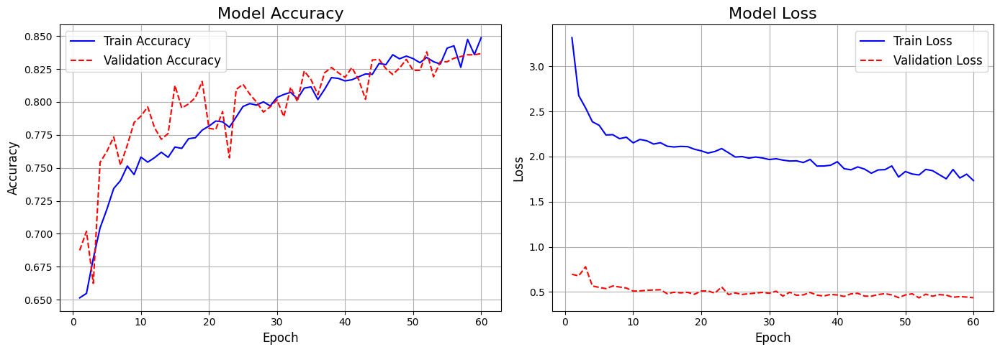

In [93]:
plot_training_curves(history)

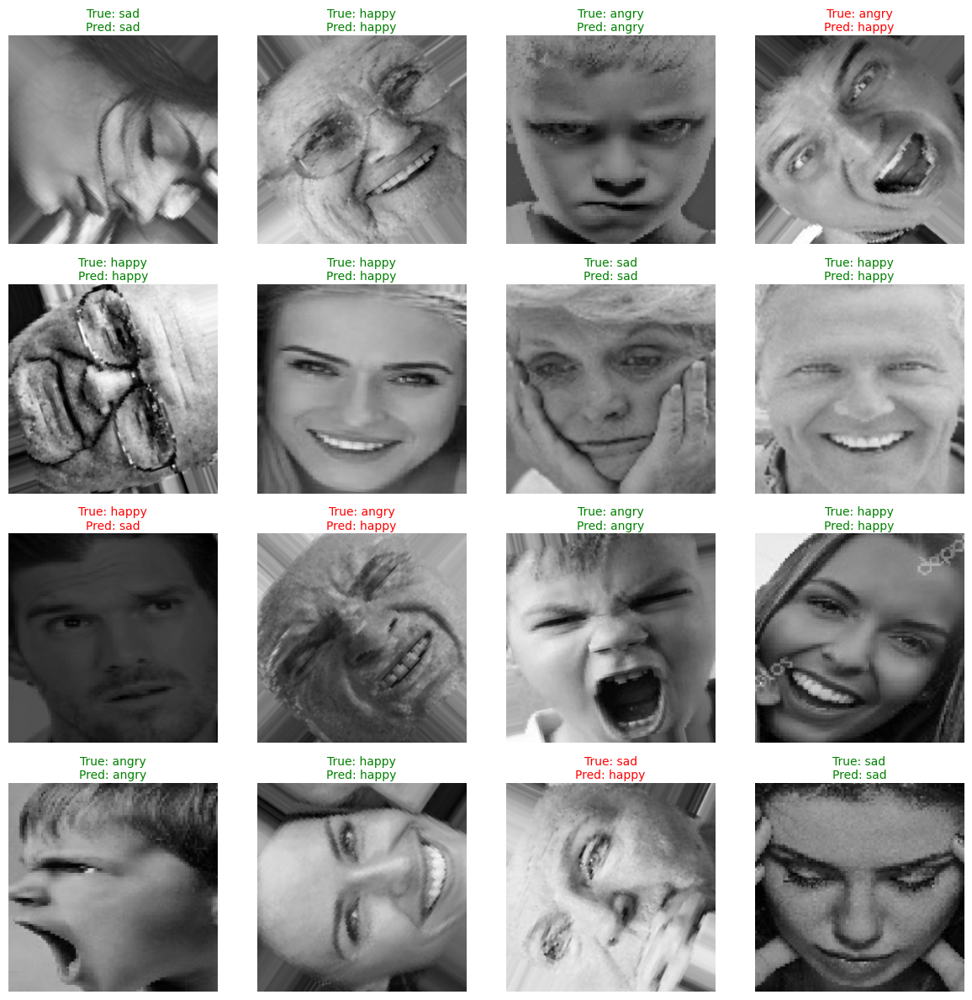

In [94]:
plot_predictions_grid(
    model=pretrained_model_imbalance,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    num_images=16,
    normalize=True
)

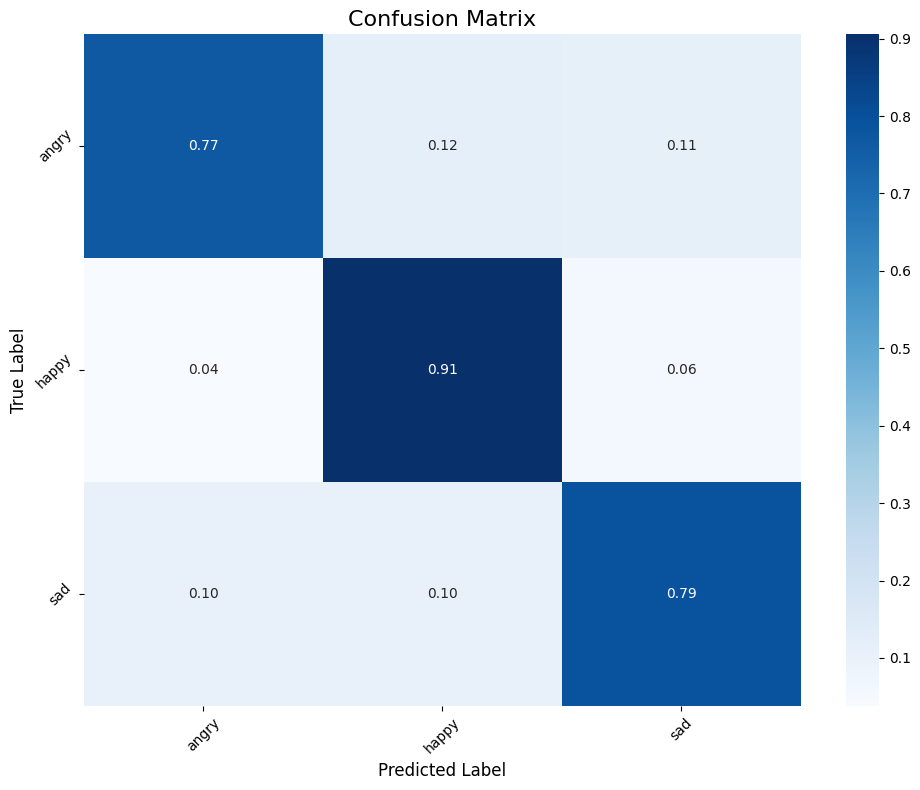

In [95]:
plot_confusion_matrix(
    model=pretrained_model_imbalance,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    normalize=True
)

In [96]:
classification_dashboard(
    model=pretrained_model_imbalance,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"]
)



Classification Report:


,precision,recall,f1-score,support
angry,0.77,0.77,0.77,515.00
happy,0.87,0.91,0.89,1006.00
sad,0.84,0.79,0.81,757.00
accuracy,0.84,0.84,0.84,0.84
macro avg,0.83,0.82,0.82,2278.00
weighted avg,0.84,0.84,0.84,2278.00


# Vision Transformers (ViT)

In [97]:
test_image = cv2.imread("/content/dataset/Emotions Dataset/Emotions Dataset/train/happy/387249.jpg")
test_image = cv2.resize(test_image, (CONFIGURATION["IM_SIZE"] ,CONFIGURATION["IM_SIZE"]))

In [98]:
patches = tf.image.extract_patches(images=tf.expand_dims(test_image, axis = 0),
                           sizes=[1, CONFIGURATION["PATCH_SIZE"], CONFIGURATION["PATCH_SIZE"], 1],
                           strides=[1, CONFIGURATION["PATCH_SIZE"], CONFIGURATION["PATCH_SIZE"], 1],
                           rates=[1, 1, 1, 1],
                           padding='VALID')

In [99]:
print(patches.shape)
patches = tf.reshape(patches, (patches.shape[0], -1, 768))
print(patches.shape)

(1, 16, 16, 768)
(1, 256, 768)


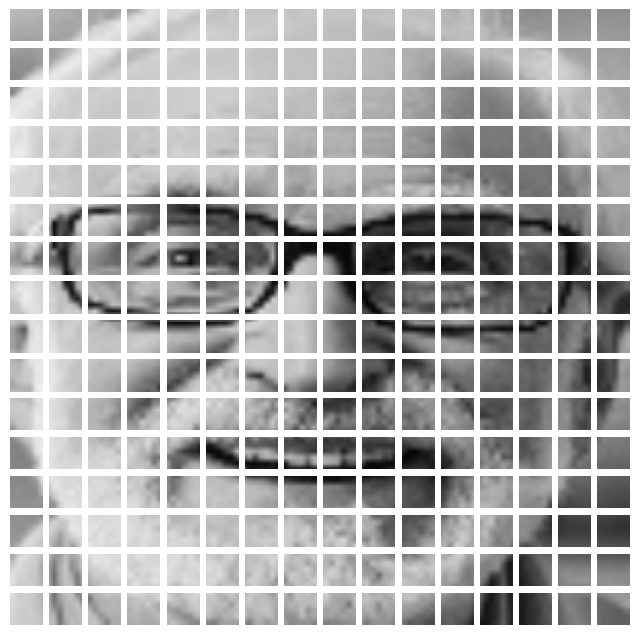

In [100]:
plt.figure(figsize = (8,8))

for i in range(patches.shape[1]):

    ax = plt.subplot(16,16, i+1)
    plt.imshow(tf.reshape(patches[0,i,:], (16,16,3)))
    plt.axis("off")

In [101]:
class PatchEncoder(Layer):
  def __init__(self, N_PATCHES, HIDDEN_SIZE):
    super(PatchEncoder, self).__init__(name = 'patch_encoder')

    self.linear_projection = Dense(HIDDEN_SIZE)
    self.positional_embedding = Embedding(N_PATCHES, HIDDEN_SIZE )
    self.N_PATCHES = N_PATCHES

  def call(self, x):
    patches = tf.image.extract_patches(
        images=x,
        sizes=[1, CONFIGURATION["PATCH_SIZE"], CONFIGURATION["PATCH_SIZE"], 1],
        strides=[1, CONFIGURATION["PATCH_SIZE"], CONFIGURATION["PATCH_SIZE"], 1],
        rates=[1, 1, 1, 1],
        padding='VALID')

    patches = tf.reshape(patches, (tf.shape(patches)[0], 256, patches.shape[-1]))

    embedding_input = tf.range(start = 0, limit = self.N_PATCHES, delta = 1 )
    output = self.linear_projection(patches) + self.positional_embedding(embedding_input)

    return output

In [102]:
class TransformerEncoder(Layer):
  def __init__(self, N_HEADS, HIDDEN_SIZE):
    super(TransformerEncoder, self).__init__(name = 'transformer_encoder')

    self.layer_norm_1 = LayerNormalization()
    self.layer_norm_2 = LayerNormalization()

    self.multi_head_att = MultiHeadAttention(N_HEADS, HIDDEN_SIZE )

    self.dense_1 = Dense(HIDDEN_SIZE, activation = tf.nn.gelu)
    self.dense_2 = Dense(HIDDEN_SIZE, activation = tf.nn.gelu)

  def call(self, input):
    x_1 = self.layer_norm_1(input)
    x_1 = self.multi_head_att(x_1, x_1)

    x_1 = Add()([x_1, input])

    x_2 = self.layer_norm_2(x_1)
    x_2 = self.dense_1(x_2)
    output = self.dense_2(x_2)
    output = Add()([output, x_1])

    return output

In [103]:
class ViT(Model):
  def __init__(self, N_HEADS, HIDDEN_SIZE, N_PATCHES, N_LAYERS, N_DENSE_UNITS):
    super(ViT, self).__init__(name = 'vision_transformer')
    self.N_LAYERS = N_LAYERS
    self.patch_encoder = PatchEncoder(N_PATCHES, HIDDEN_SIZE)
    self.trans_encoders = [TransformerEncoder(N_HEADS, HIDDEN_SIZE) for _ in range(N_LAYERS)]
    self.dense_1 = Dense(N_DENSE_UNITS, tf.nn.gelu)
    self.dense_2 = Dense(N_DENSE_UNITS, tf.nn.gelu)
    self.dense_3 = Dense(CONFIGURATION["NUM_CLASSES"], activation = 'softmax')
  def call(self, input, training = True):

    x = self.patch_encoder(input)

    for i in range(self.N_LAYERS):
      x = self.trans_encoders[i](x)
    x = Flatten()(x)
    x = self.dense_1(x)
    x = self.dense_2(x)

    return self.dense_3(x)

In [104]:
vit = ViT(
    N_HEADS = 4, HIDDEN_SIZE = 768, N_PATCHES = 256,
    N_LAYERS = 2, N_DENSE_UNITS = 128)
vit(tf.zeros([2,256,256,3]))

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[0.41106966, 0.30599082, 0.28293955],
       [0.41106966, 0.30599082, 0.28293955]], dtype=float32)>

In [105]:
vit.summary()

Model: "vision_transformer"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ patch_encoder (PatchEncoder)    │ ?                      │       787,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_encoder             │ ?                      │    10,631,424 │
│ (TransformerEncoder)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_encoder             │ ?                      │    10,631,424 │
│ (TransformerEncoder)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (2, 128)               │    25,165,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (2, 128)               │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (2, 3)                 │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,232,899 (180.18 MB)

 Trainable params: 47,232,899 (180.18 MB)

 Non-trainable params: 0 (0.00 B)

In [106]:
vit.compile(
    optimizer = Adam(learning_rate=CONFIGURATION["LEARNING_RATE"]),
    loss = loss_function,
    metrics = metrics
)

In [107]:
history = vit.fit(
    training_dataset,
    validation_data = validation_dataset,
    epochs = CONFIGURATION["N_EPOCHS"],
    verbose = 1,
    # class_weight = class_weights,
)

Epoch 1/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 64s 204ms/step - accuracy: 0.5971 - loss: 2629.5195 - top-3-accuracy: 1.0000 - val_accuracy: 0.4385 - val_loss: 19.8706 - val_top-3-accuracy: 1.0000
Epoch 2/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - accuracy: 0.4041 - loss: 15.3750 - top-3-accuracy: 1.0000 - val_accuracy: 0.4552 - val_loss: 5.1475 - val_top-3-accuracy: 1.0000
Epoch 3/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 28s 127ms/step - accuracy: 0.4376 - loss: 4.5340 - top-3-accuracy: 1.0000 - val_accuracy: 0.3863 - val_loss: 1.9889 - val_top-3-accuracy: 1.0000
Epoch 4/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - accuracy: 0.4470 - loss: 1.8992 - top-3-accuracy: 1.0000 - val_accuracy: 0.5092 - val_loss: 1.1275 - val_top-3-accuracy: 1.0000
Epoch 5/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 29s 128ms/step - accuracy: 0.4743 - loss: 1.4643 - top-3-accuracy: 1.0000 - val_accuracy: 0.5132 - val_loss: 1.0817 - val_top-3-accuracy: 1.0000
Epoch 6/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 29s 127ms/step - accuracy: 0.4

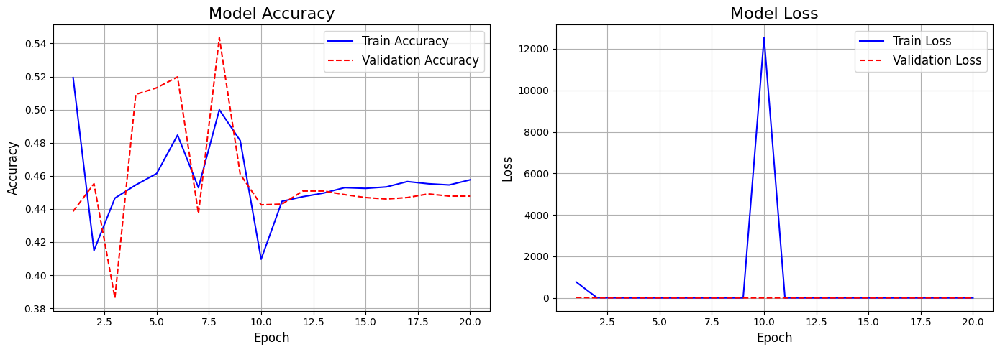

In [108]:
plot_training_curves(history)

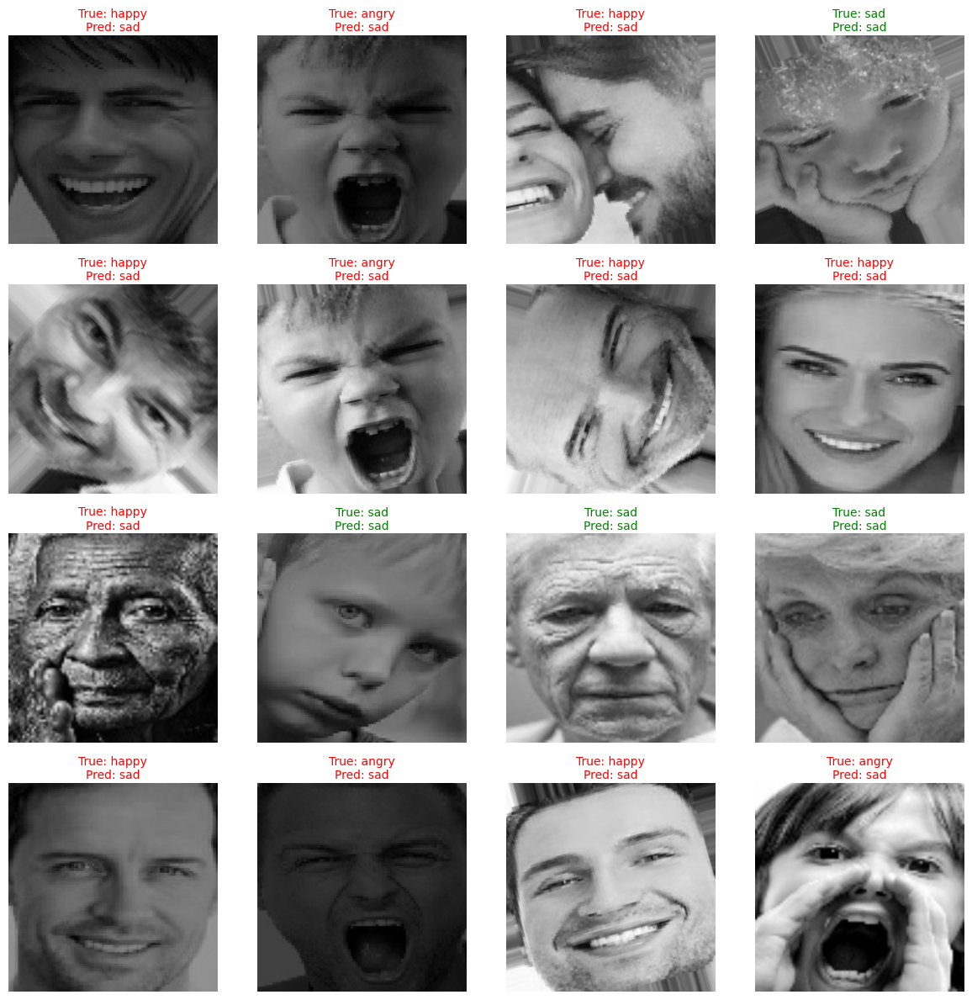

In [109]:
plot_predictions_grid(
    model=vit,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    num_images=16,
    normalize=True
)

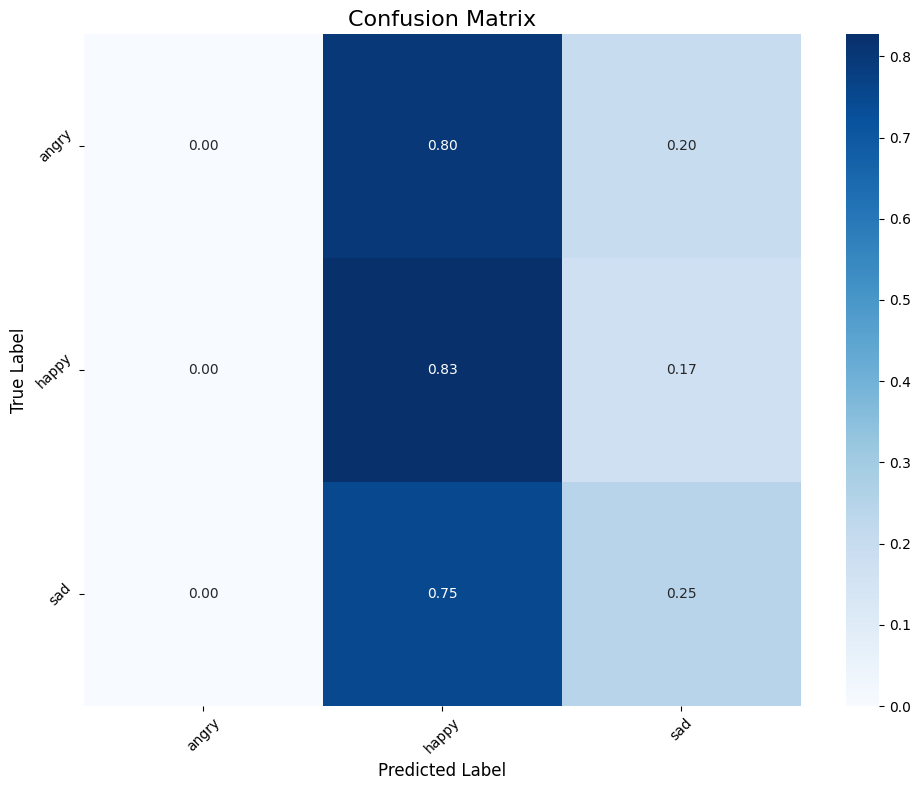

In [110]:
plot_confusion_matrix(
    model=vit,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    normalize=True
)

In [111]:
classification_dashboard(
    model=vit,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"]
)



Classification Report:


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,precision,recall,f1-score,support
angry,0.00,0.00,0.00,515.00
happy,0.46,0.83,0.59,1006.00
sad,0.40,0.25,0.31,757.00
accuracy,0.45,0.45,0.45,0.45
macro avg,0.29,0.36,0.30,2278.00
weighted avg,0.34,0.45,0.36,2278.00


# Huggingface

In [112]:
!pip install transformers

In [113]:
resize_rescale_hf = tf.keras.Sequential([
       Resizing(224, 224),
       Rescaling(1./255),
       Permute((3,1,2))
])

In [114]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Resizing, Rescaling, Permute, Lambda
from tensorflow.keras.models import Model
from transformers import TFViTModel

# Preprocessing pipeline
resize_rescale_hf = tf.keras.Sequential([
    Resizing(224, 224),
    Rescaling(1./255),
    Permute((3, 1, 2))  # (H, W, C) -> (C, H, W) for ViT
])

# Load Hugging Face ViT model
base_model = TFViTModel.from_pretrained("google/vit-base-patch16-224-in21k")

# Wrap model call in Lambda to defer execution to runtime
def extract_cls_token(x):
    outputs = base_model(x)
    return outputs.last_hidden_state[:, 0, :]  # CLS token

# Build the model
inputs = Input(shape=(256, 256, 3))
x = resize_rescale_hf(inputs)
x = Lambda(extract_cls_token)(x)
output = Dense(CONFIGURATION["NUM_CLASSES"], activation='softmax')(x)

hf_model = Model(inputs=inputs, outputs=output)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

TensorFlow and JAX classes are deprecated and will be removed in Transformers v5. We recommend migrating to PyTorch classes or pinning your version of Transformers.
All PyTorch model weights were used when initializing TFViTModel.

All the weights of TFViTModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


In [115]:
test_image = cv2.imread("/content/dataset/Emotions Dataset/Emotions Dataset/train/happy/387249.jpg")
test_image = cv2.resize(test_image, (CONFIGURATION["IM_SIZE"] ,CONFIGURATION["IM_SIZE"]))

In [116]:
hf_model(tf.expand_dims(test_image, axis = 0))

<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[0.4191269 , 0.34270436, 0.23816872]], dtype=float32)>

In [117]:
hf_model.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_6 (Sequential)       │ (None, 3, 224, 224)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 3)              │         2,307 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,307 (9.01 KB)

 Trainable params: 2,307 (9.01 KB)

 Non-trainable params: 0 (0.00 B)

In [118]:
hf_model.compile(
    optimizer = Adam(learning_rate = 5e-5),
    loss = loss_function,
    metrics = metrics
)

In [121]:
from wandb.integration.keras import WandbMetricsLogger, WandbModelCheckpoint

In [123]:
history = hf_model.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=CONFIGURATION["N_EPOCHS"],
    verbose=1,
    callbacks=[
        WandbMetricsLogger(),  # Logs metrics to W&B
        WandbModelCheckpoint(filepath='model_checkpoint.keras')  # Optional model saving
    ]
)


Epoch 1/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 51s 234ms/step - accuracy: 0.3094 - loss: 1.1366 - top-3-accuracy: 1.0000 - val_accuracy: 0.5110 - val_loss: 1.0314 - val_top-3-accuracy: 1.0000
Epoch 2/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 29s 129ms/step - accuracy: 0.5119 - loss: 1.0223 - top-3-accuracy: 1.0000 - val_accuracy: 0.5443 - val_loss: 0.9609 - val_top-3-accuracy: 1.0000
Epoch 3/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 29s 130ms/step - accuracy: 0.5494 - loss: 0.9751 - top-3-accuracy: 1.0000 - val_accuracy: 0.5865 - val_loss: 0.9072 - val_top-3-accuracy: 1.0000
Epoch 4/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - accuracy: 0.5911 - loss: 0.9333 - top-3-accuracy: 1.0000 - val_accuracy: 0.6159 - val_loss: 0.8652 - val_top-3-accuracy: 1.0000
Epoch 5/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 29s 131ms/step - accuracy: 0.6127 - loss: 0.9015 - top-3-accuracy: 1.0000 - val_accuracy: 0.6409 - val_loss: 0.8309 - val_top-3-accuracy: 1.0000
Epoch 6/20
213/213 ━━━━━━━━━━━━━━━━━━━━ 30s 131ms/step - accuracy: 0.6617 -

In [124]:
# history = hf_model.fit(
#     training_dataset,
#     validation_data = validation_dataset,
#     epochs = CONFIGURATION["N_EPOCHS"],
#     verbose = 1,
#     # class_weight = class_weights,
#     callbacks = [WandbCallback()]
# )

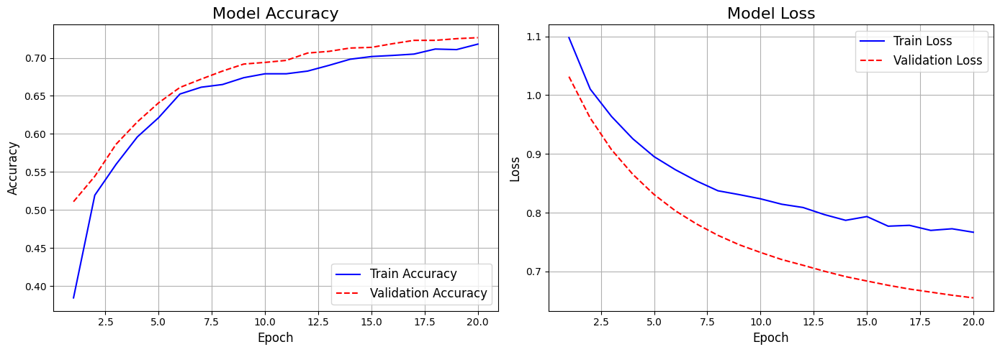

In [125]:
plot_training_curves(history)

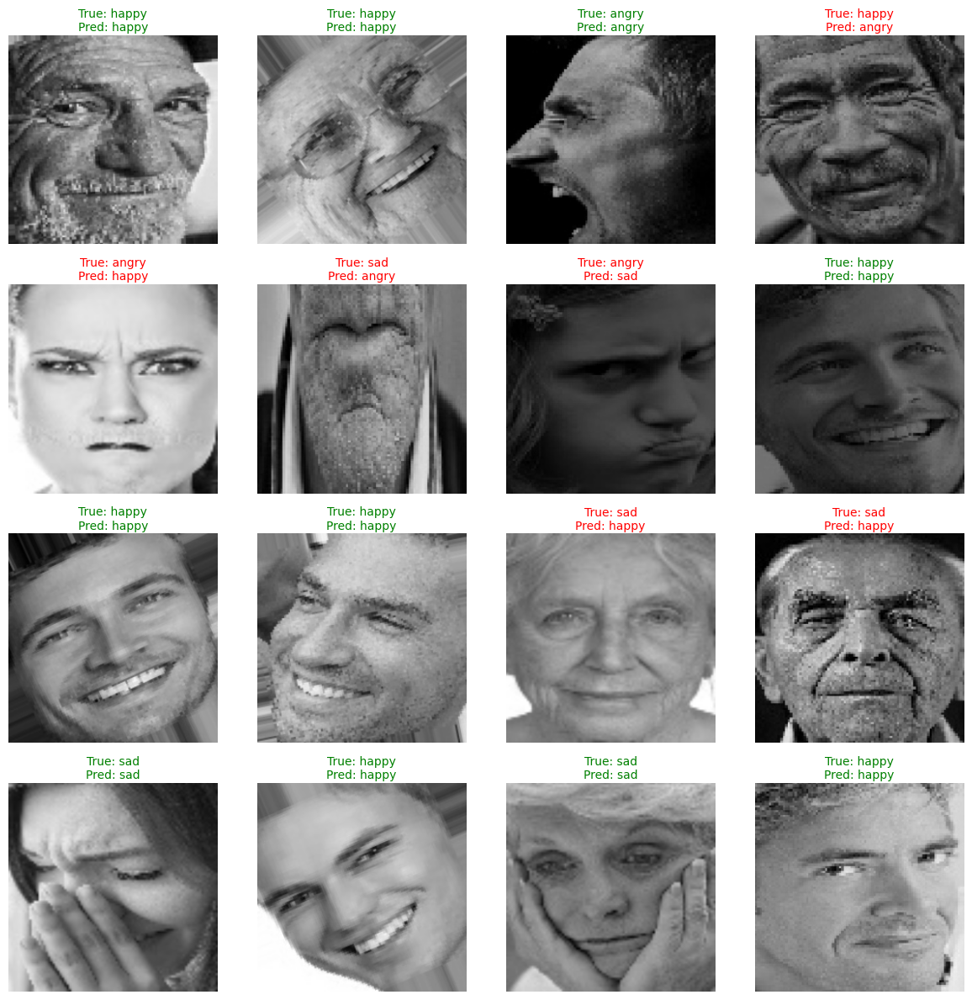

In [126]:
plot_predictions_grid(
    model=hf_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    num_images=16,
    normalize=True
)

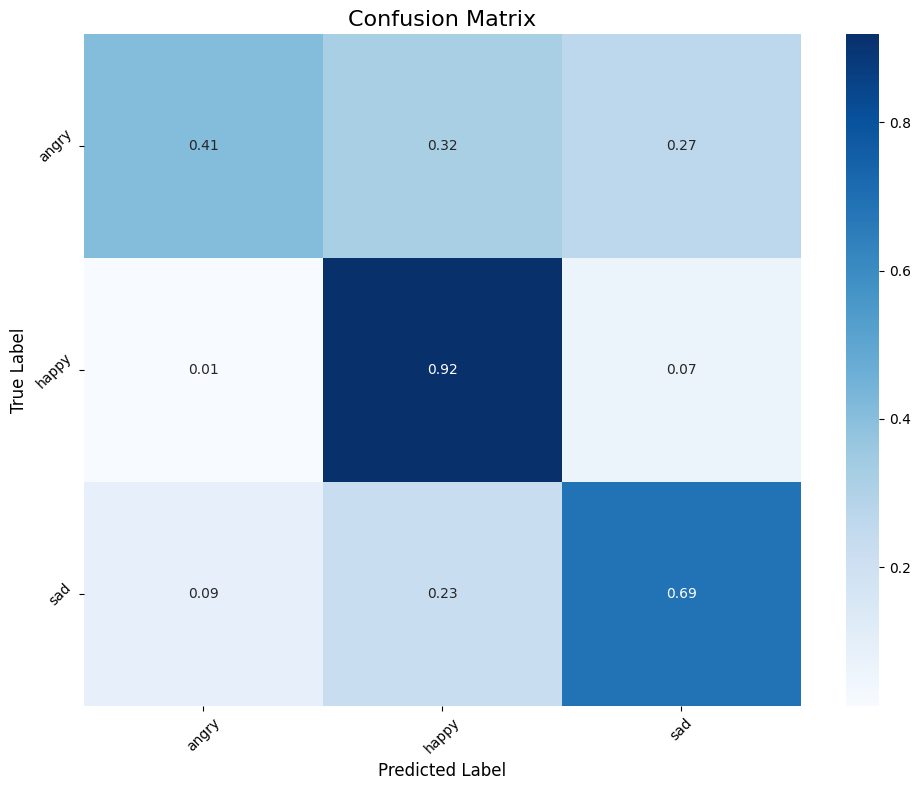

In [127]:
plot_confusion_matrix(
    model=hf_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"],
    normalize=True
)

In [128]:
classification_dashboard(
    model=hf_model,
    dataset=validation_dataset,
    class_names=CONFIGURATION["CLASS_NAMES"]
)



Classification Report:


,precision,recall,f1-score,support
angry,0.73,0.41,0.53,515.00
happy,0.73,0.92,0.82,1006.00
sad,0.72,0.69,0.70,757.00
accuracy,0.73,0.73,0.73,0.73
macro avg,0.72,0.67,0.68,2278.00
weighted avg,0.73,0.73,0.71,2278.00
